In [2]:
!pip install pdfplumber
!pip install spacy
!python -m spacy download en_core_web_sm
!pip install networkx
!pip install scikit-learn
!pip install vaderSentiment
!pip install sumy

  Using cached https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.7.1/en_core_web_sm-3.7.1-py3-none-any.whl (12.8 MB)
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.3/97.3 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 49.4 MB/s eta 0:00:00
  Created wheel for breadability: filename=breadability-0.1.20-py2.py3-none-any.whl size=21692 sha256=867032e83f21af7dec290456efe3f4dc9843311fde814452c7ed479399803465
  Stored in directory: /root/.cache/

In [3]:
import pdfplumber
import os
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
import spacy
import pandas as pd
import pickle
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from textblob import TextBlob
import pickle
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import re
from IPython.display import display
from collections import Counter
import numpy as np

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [4]:
# Modell betöltés
nlp = spacy.load('en_core_web_sm')

In [5]:
# A mappa, ahol a PDF fájlok találhatók
path = "/content/"

# PDF fájlok listájának megszerzése
files = [f for f in os.listdir(path) if f.endswith('.pdf')]

# PDF szövegek feldolgozása
documents = []  # Itt tároljuk az egyes PDF-ek szövegét
book_titles = []  # Itt tároljuk a PDF fájlneveket (könyvcímeket)

for i, file in enumerate(files, start=1):
    try:
        print(f"Feldolgozás alatt: {file} ({i}/{len(files)})")
        with pdfplumber.open(os.path.join(path, file)) as pdf:
            text = ""
            for page_number, page in enumerate(pdf.pages, start=1):
                page_text = page.extract_text()
                if page_text:  # Csak akkor adjuk hozzá, ha van tartalom
                    text += page_text

        # Az aktuális PDF szövegének hozzáadása a listához
        documents.append(text)

        # PDF címének (fájlnév) hozzáadása a listához
        book_titles.append(file.replace('.pdf', ''))
        print(f"Sikeres feldolgozás: {file}")

    except Exception as e:
        print(f"Hiba történt a {file} beolvasásakor: {e}")

print(f"\nÖsszesen feldolgozott fájlok száma: {len(documents)}")
print(f"Beolvasott könyvcímek: {book_titles}\n")

df = pd.DataFrame({
    'Cím': book_titles,
    'Szöveg': documents
})


Feldolgozás alatt: Layla.pdf (1/10)
Sikeres feldolgozás: Layla.pdf
Feldolgozás alatt: Heart Bones.pdf (2/10)
Sikeres feldolgozás: Heart Bones.pdf
Feldolgozás alatt: November 9.pdf (3/10)
Sikeres feldolgozás: November 9.pdf
Feldolgozás alatt: Reminders of Him.pdf (4/10)
Sikeres feldolgozás: Reminders of Him.pdf
Feldolgozás alatt: It Starts with Us.pdf (5/10)
Sikeres feldolgozás: It Starts with Us.pdf
Feldolgozás alatt: Regretting You.pdf (6/10)
Sikeres feldolgozás: Regretting You.pdf
Feldolgozás alatt: Verity.pdf (7/10)
Sikeres feldolgozás: Verity.pdf
Feldolgozás alatt: Ugly Love.pdf (8/10)
Sikeres feldolgozás: Ugly Love.pdf
Feldolgozás alatt: Hopeless.pdf (9/10)
Sikeres feldolgozás: Hopeless.pdf
Feldolgozás alatt: It Ends With Us.pdf (10/10)
Sikeres feldolgozás: It Ends With Us.pdf

Összesen feldolgozott fájlok száma: 10
Beolvasott könyvcímek: ['Layla', 'Heart Bones', 'November 9', 'Reminders of Him', 'It Starts with Us', 'Regretting You', 'Verity', 'Ugly Love', 'Hopeless', 'It Ends Wi

In [7]:
# Szöveg előfeldolgozás
proc_doc = []  # Az összes feldolgozott dokumentumot itt tároljuk

for i, doc in enumerate(documents):
    print(f"Szöveg előfeldolgozása: {book_titles[i]} ({i+1}/{len(documents)})")
    spacy_doc = nlp(doc)  # SpaCy-vel feldolgozzuk az egész szöveget

    # Tokenizálás
    tokens = [token.text for token in spacy_doc]

    # Mondatokra bontás
    sentences = [sent.text for sent in spacy_doc.sents]

    # POS-tagging (szó + POS)
    pos_tags = [(token.text, token.pos_) for token in spacy_doc]

    # Lemmatizálás
    lemmas = [token.lemma_ for token in spacy_doc]

    # Stopszó szűrés (angol stopszavak)
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [token for token in tokens if token.lower() not in stop_words]

    # TF-IDF
    tfidf_vect = TfidfVectorizer(max_features=800)
    tfidf_mtx = tfidf_vect.fit_transform([' '.join(lemmas)])

    # N-gramok
    ngram_vect = CountVectorizer(ngram_range=(3, 3))
    ngram_mtx = ngram_vect.fit_transform([' '.join(lemmas)])

    # Az összes feldolgozott adatot tároljuk egy szótárban
    proc_data = {
        'title': book_titles[i],
        'tokens': tokens,
        'sentences': sentences,
        'pos_tags': pos_tags,
        'lemmas': lemmas,
        'filtered_tokens': filtered_tokens,
        'tfidf_mtx': tfidf_mtx.toarray(),
        'ngram_mtx': ngram_mtx.toarray()
    }

    proc_doc.append(proc_data)

Szöveg előfeldolgozása: Layla (1/10)
Szöveg előfeldolgozása: Heart Bones (2/10)
Szöveg előfeldolgozása: November 9 (3/10)
Szöveg előfeldolgozása: Reminders of Him (4/10)
Szöveg előfeldolgozása: It Starts with Us (5/10)
Szöveg előfeldolgozása: Regretting You (6/10)
Szöveg előfeldolgozása: Verity (7/10)
Szöveg előfeldolgozása: Ugly Love (8/10)
Szöveg előfeldolgozása: Hopeless (9/10)
Szöveg előfeldolgozása: It Ends With Us (10/10)


In [8]:
# Mentés pickle fájlba
with open('/content/proc_doc.pkl', 'wb') as f:
    pickle.dump(proc_doc, f)

print("Az előfeldolgozott szövegek sikeresen elmentve: proc_doc.pkl")


Az előfeldolgozott szövegek sikeresen elmentve: proc_doc.pkl


In [9]:
pickle_path = '/content/proc_doc.pkl'

# Fájl betöltése
try:
    with open(pickle_path, 'rb') as f:
        proc_doc = pickle.load(f)
    print(f"Az előfeldolgozott szövegek sikeresen betöltve ({len(proc_doc)} könyv).")
except Exception as e:
    print(f"Hiba történt a pickle fájl betöltése során: {e}")



Az előfeldolgozott szövegek sikeresen betöltve (10 könyv).


Feldolgozás: Layla
Top 5 melléknév: [('more', 99), ('other', 79), ('few', 78), ('same', 57), ('asleep', 48)]


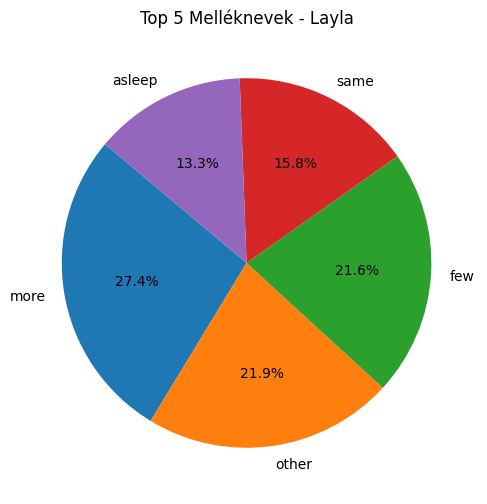

Feldolgozás: Heart Bones
Top 5 melléknév: [('other', 116), ('more', 98), ('few', 69), ('only', 51), ('same', 47)]


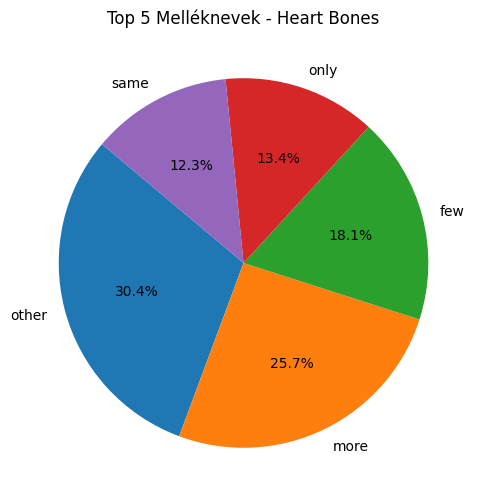

Feldolgozás: November 9
Top 5 melléknév: [('more', 123), ('few', 97), ('same', 73), ('other', 68), ('entire', 58)]


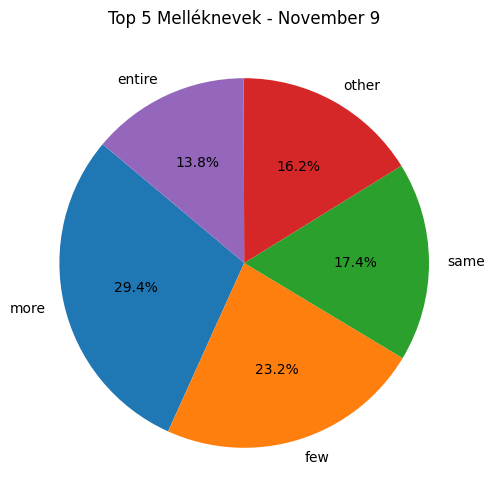

Feldolgozás: Reminders of Him
Top 5 melléknév: [('more', 102), ('other', 86), ('same', 65), ('few', 63), ('only', 56)]


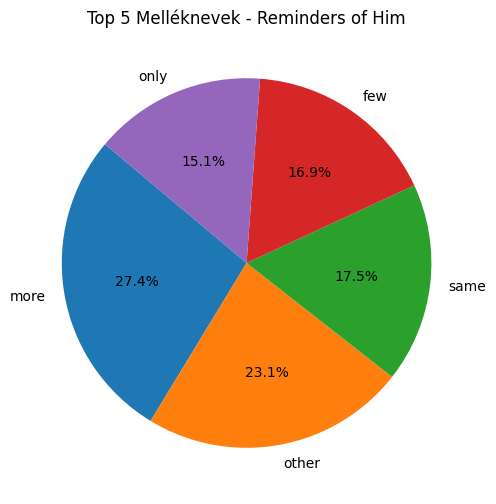

Feldolgozás: It Starts with Us
Top 5 melléknév: [('more', 109), ('other', 91), ('few', 65), ('same', 47), ('asleep', 39)]


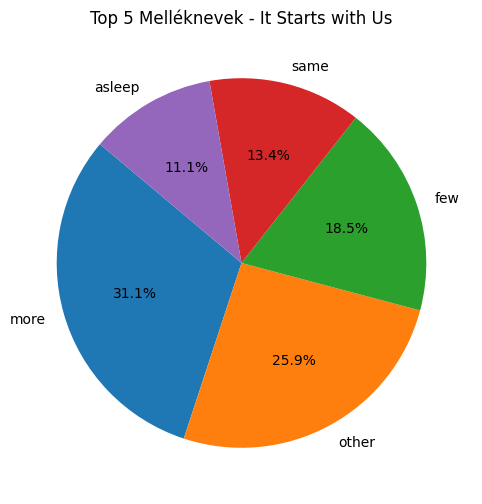

Feldolgozás: Regretting You
Top 5 melléknév: [('more', 112), ('other', 106), ('same', 88), ('few', 77), ('only', 59)]


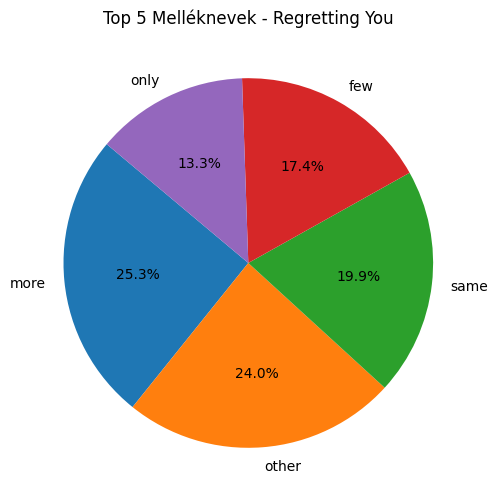

Feldolgozás: Verity
Top 5 melléknév: [('more', 126), ('other', 107), ('few', 86), ('same', 50), ('own', 48)]


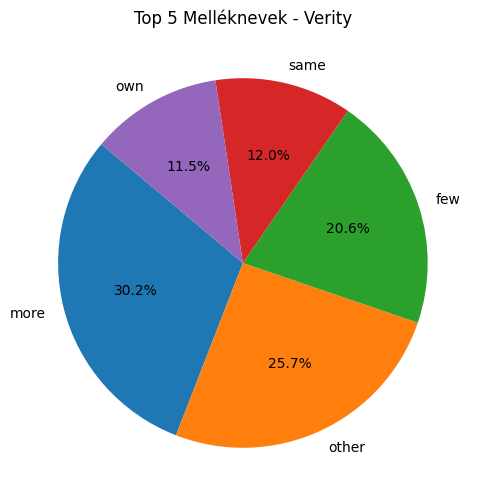

Feldolgozás: Ugly Love
Top 5 melléknév: [('more', 142), ('other', 85), ('same', 82), ('few', 66), ('only', 56)]


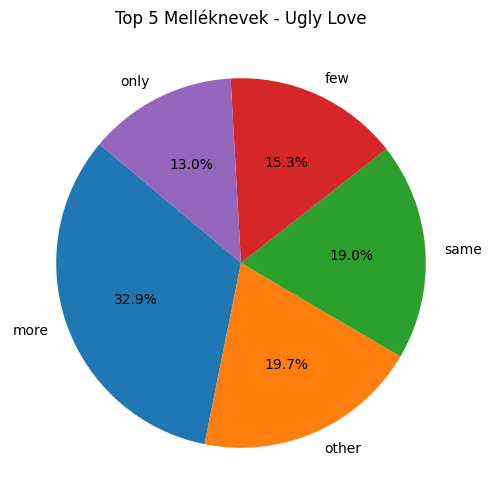

Feldolgozás: Hopeless
Top 5 melléknév: [('more', 153), ('other', 123), ('few', 94), ('same', 83), ('only', 62)]


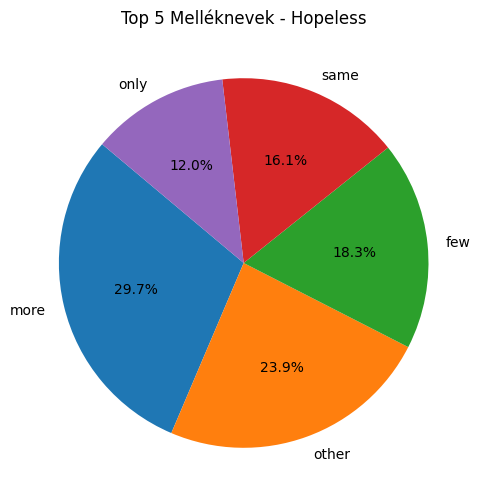

Feldolgozás: It Ends With Us
Top 5 melléknév: [('more', 124), ('other', 115), ('few', 103), ('same', 55), ('own', 50)]


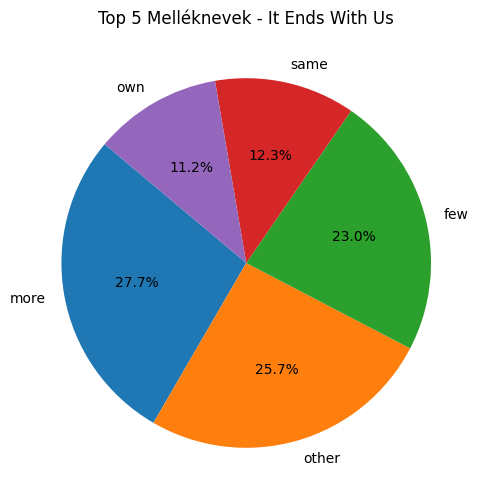

Összesített top 5 melléknév az összes könyvből: [('more', 1188), ('other', 976), ('few', 798), ('same', 647), ('only', 284)]


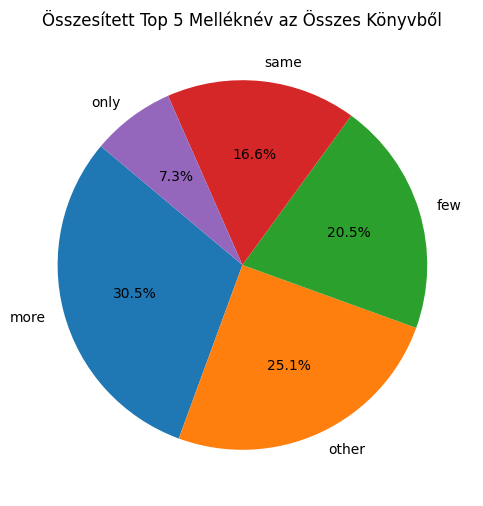

In [10]:
excl_words = {'last', 'sure', 'first', 'good', 'bad', 'little', 'much', 'many', 'able', 'okay', 'next',
              'better', 'best', 'whole', 'sorry', 'wrong', "right", 'thing', 'things', 'something',
              'anything', 'everything', 'nothing', 'time', 'year', 'day', 'moment', 'night',
              'life', 'man', 'woman', 'boy', 'girl', 'child', 'children', 'kid', 'kids', 'face',
              'hand', 'arm', 'head', 'body', 'heart', 'person', 'people'}

# Top 5 melléknév
def top_adjs(doc):
    adjs = [tok for tok, pos in doc['pos_tags'] if pos == 'ADJ']
    filt_adjs = [adj for adj in adjs if adj.lower() not in excl_words]
    top_5 = Counter(filt_adjs).most_common(5)
    return top_5

# Kördiagram
def pie_chart(data, title):
    if len(data) == 0:
        print(f"Kevés adat a '{title}' könyvhöz.")
        return

    labels, values = zip(*data)
    plt.figure(figsize=(6, 6))
    plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=140)
    plt.title(title)
    plt.show()

all_adjs = Counter()

for doc in proc_doc:
    print(f"Feldolgozás: {doc['title']}")
    try:
        top_5 = top_adjs(doc)
        print(f"Top 5 melléknév: {top_5}")

        all_adjs.update(dict(top_5))

        pie_chart(top_5, f"Top 5 Melléknevek - {doc['title']}")
    except Exception as e:
        print(f"Hiba történt a '{doc['title']}' könyvnél: {e}")

# Összesített top 5 melléknév
top_5_all = all_adjs.most_common(5)

print(f"Összesített top 5 melléknév az összes könyvből: {top_5_all}")

# Összesített kördiagram
pie_chart(top_5_all, "Összesített Top 5 Melléknév az Összes Könyvből")


Feldolgozás: Layla
Top 10 szó: [('Layla', 880), ('say', 508), ('like', 505), ('know', 433), ('back', 410), ('want', 409), ('feel', 399), ('look', 368), ('Willow', 346), ('go', 340)]


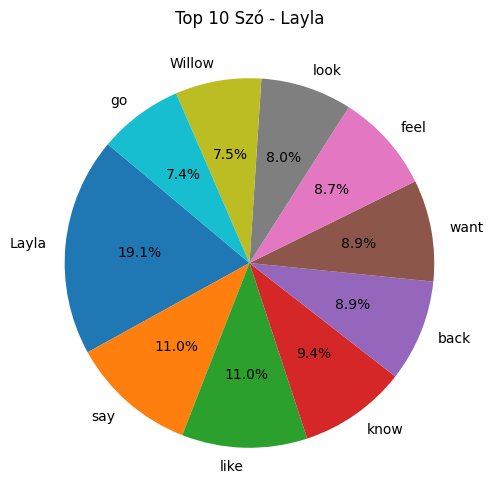


Feldolgozás: Heart Bones
Top 10 szó: [('Samson', 584), ('like', 547), ('say', 536), ('look', 422), ('know', 399), ('get', 333), ('want', 332), ('back', 325), ('go', 312), ('feel', 293)]


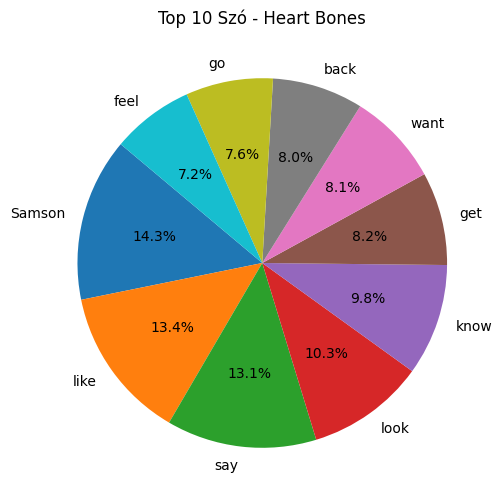


Feldolgozás: November 9
Top 10 szó: [('say', 558), ('know', 455), ('Ben', 449), ('like', 386), ('want', 376), ('look', 365), ('make', 343), ('back', 335), ('one', 317), ('go', 312)]


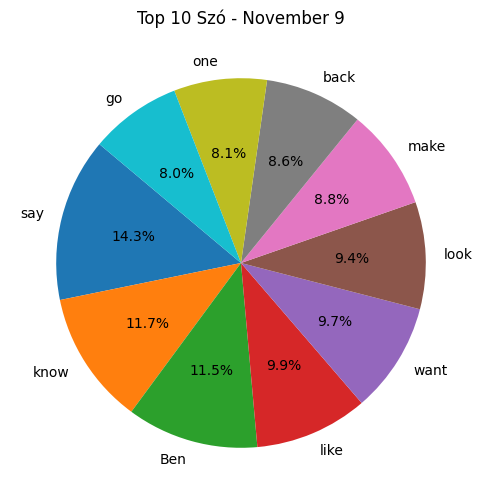


Feldolgozás: Reminders of Him
Top 10 szó: [('say', 677), ('know', 573), ('like', 542), ('want', 503), ('get', 420), ('look', 420), ('back', 410), ('Diem', 387), ('make', 368), ('go', 366)]


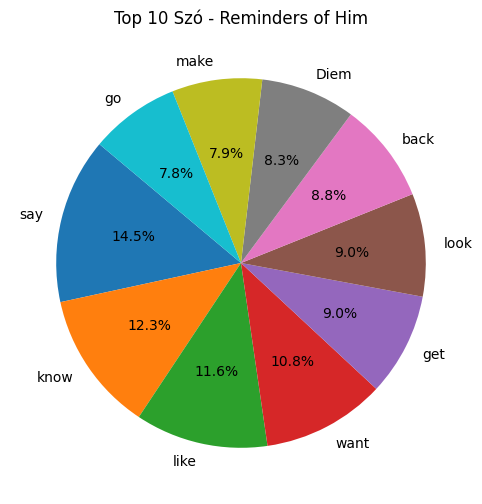


Feldolgozás: It Starts with Us
Top 10 szó: [('say', 520), ('know', 468), ('like', 463), ('back', 420), ('Atlas', 416), ('make', 370), ('go', 370), ('want', 369), ('get', 349), ('look', 332)]


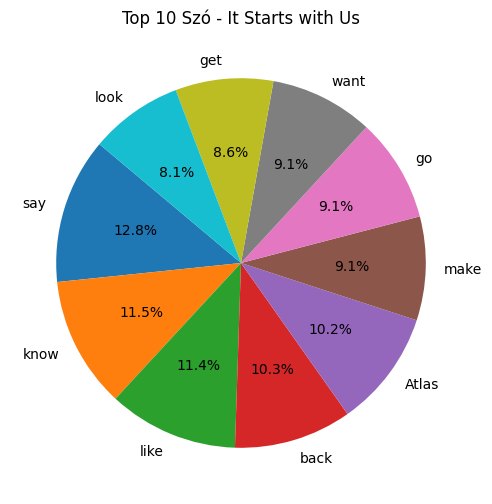


Feldolgozás: Regretting You
Top 10 szó: [('Jonah', 689), ('like', 607), ('say', 602), ('Miller', 529), ('know', 523), ('back', 516), ('look', 507), ('feel', 461), ('want', 458), ('get', 449)]


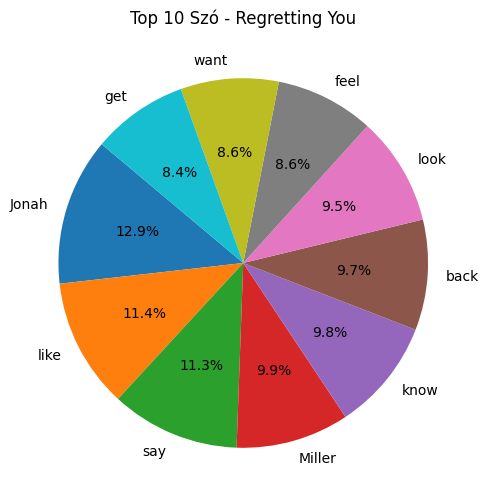


Feldolgozás: Verity
Top 10 szó: [('Jeremy', 608), ('say', 427), ('back', 389), ('know', 365), ('look', 350), ('would', 348), ('like', 327), ('want', 321), ('verity', 299), ('make', 289)]


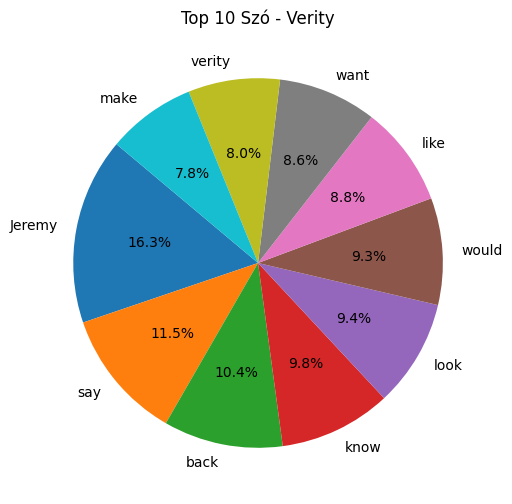


Feldolgozás: Ugly Love
Top 10 szó: [('say', 697), ('want', 484), ('know', 443), ('back', 438), ('Miles', 434), ('look', 427), ('like', 395), ('eye', 338), ('tell', 325), ('make', 321)]


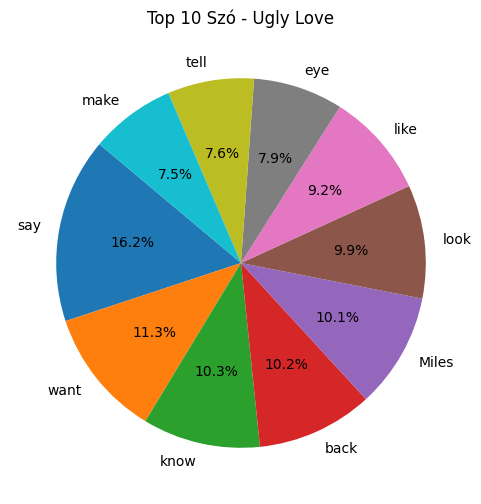


Feldolgozás: Hopeless
Top 10 szó: [('say', 744), ('know', 716), ('back', 659), ('look', 607), ('want', 582), ('eye', 494), ('like', 478), ('take', 400), ('Holder', 386), ('feel', 381)]


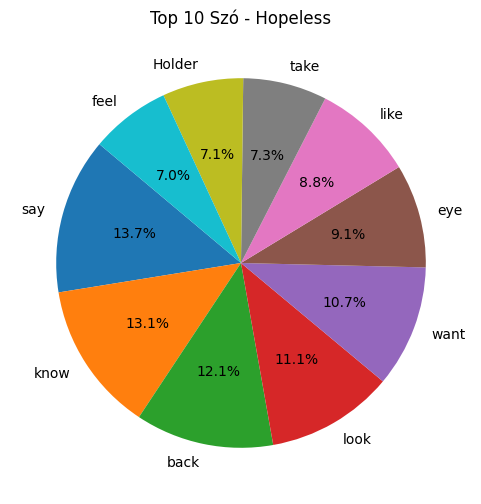


Feldolgozás: It Ends With Us
Top 10 szó: [('say', 876), ('know', 515), ('like', 495), ('Ryle', 481), ('back', 477), ('look', 468), ('get', 391), ('make', 387), ('want', 377), ('go', 376)]


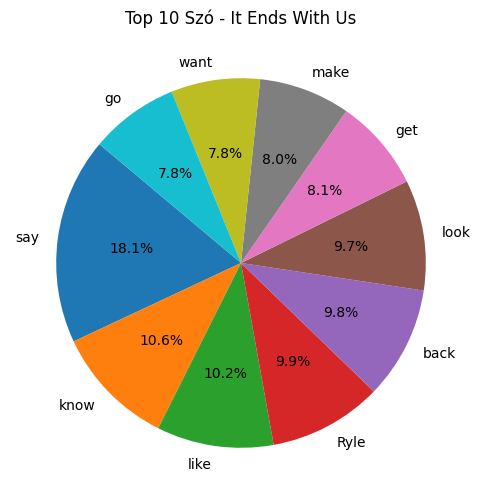

Összesített top 10 szó az összes könyvből: [('say', 6145), ('know', 4890), ('like', 4745), ('back', 4379), ('look', 4266), ('want', 4211), ('make', 2078), ('go', 2076), ('get', 1942), ('feel', 1534)]


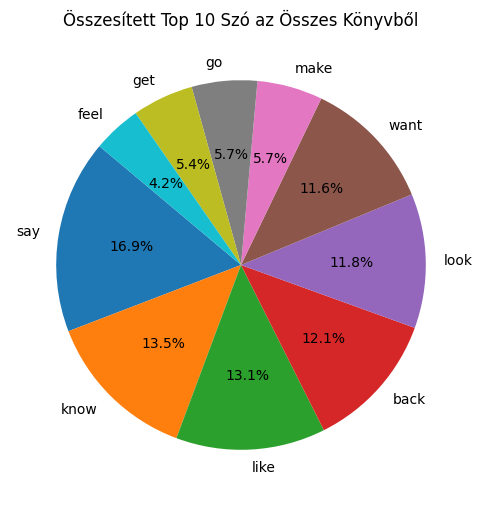

In [14]:
# Összesített stop szó lista
excl_words = stop_words.union(excl_words)

# Top 10 leggyakoribb szó
def top_10_words(doc):
    # Csak betűkből álló szavakat tartunk meg
    filt_toks = [tok for tok in doc['lemmas'] if tok.isalpha()]
    # Stop szavak szűrése
    filt_toks = [tok for tok in filt_toks if tok.lower() not in excl_words]
    # Leggyakoribb 10 szó
    top_10 = Counter(filt_toks).most_common(10)
    return top_10

# Kördiagram
def pie_chart(data, title):
    if len(data) == 0:
        print(f"Kevés adat a '{title}' könyvhöz.")
        return

    labels, values = zip(*data)
    plt.figure(figsize=(6, 6))
    plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=140)
    plt.title(title)
    plt.show()

# Minden könyvhöz top 10 leggyakoribb szó
all_words = Counter()

for doc in proc_doc:
    print(f"\nFeldolgozás: {doc['title']}")
    try:
        top_10 = top_10_words(doc)
        print(f"Top 10 szó: {top_10}")

        all_words.update(dict(top_10))

        pie_chart(top_10, f"Top 10 Szó - {doc['title']}")
    except Exception as e:
        print(f"Hiba történt a '{doc['title']}' könyvnél: {e}")

# Összesített top 10 szó
top_10_all = all_words.most_common(10)
print(f"Összesített top 10 szó az összes könyvből: {top_10_all}")

# Összesített kördiagram
pie_chart(top_10_all, "Összesített Top 10 Szó az Összes Könyvből")



Szófelhő generálása: Layla


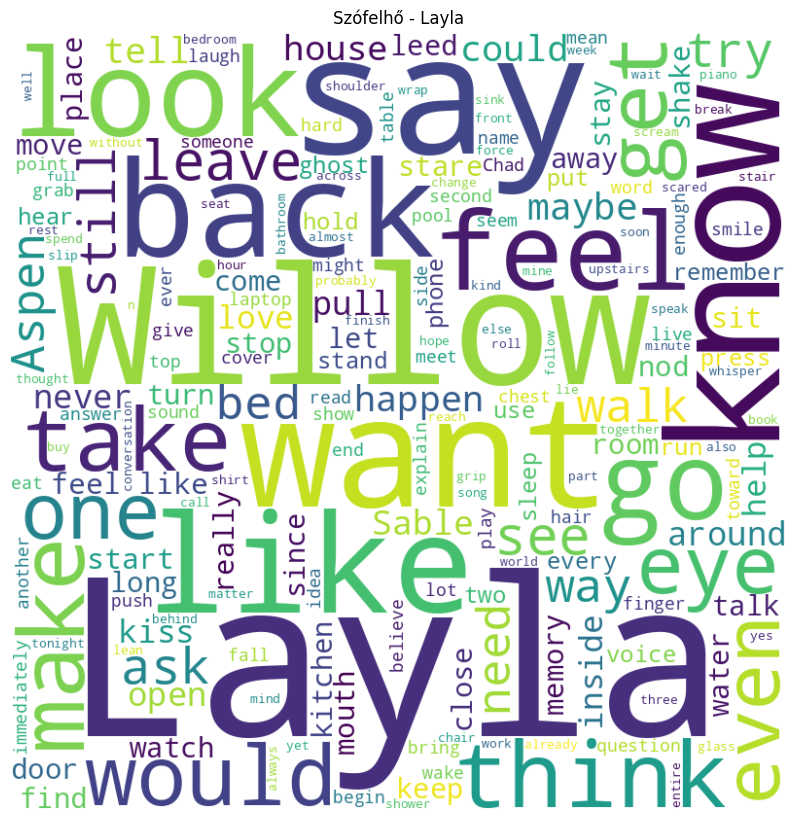


Szófelhő generálása: Heart Bones


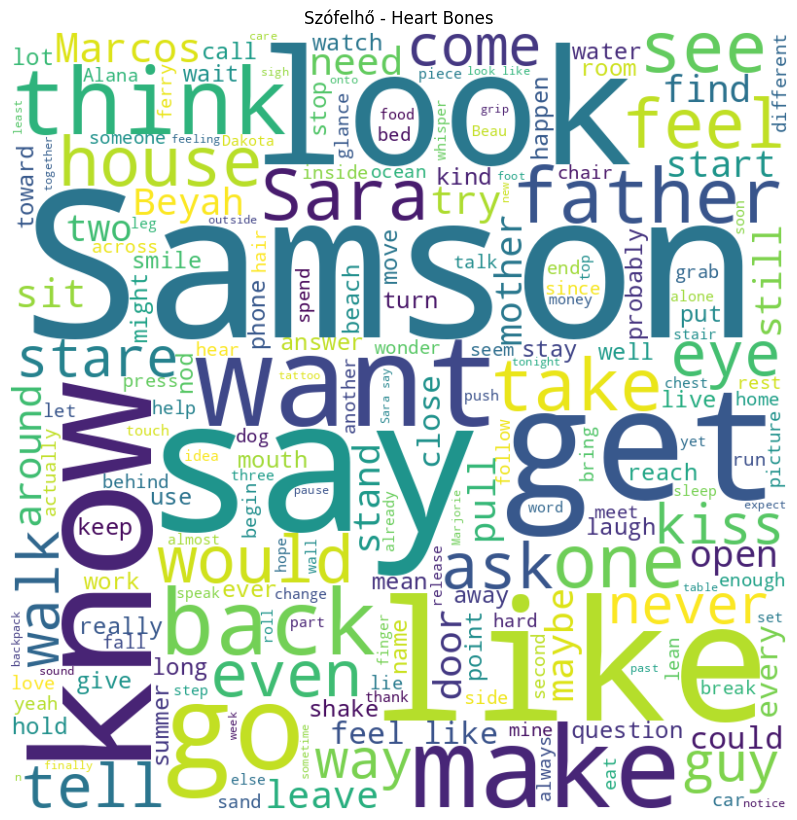


Szófelhő generálása: November 9


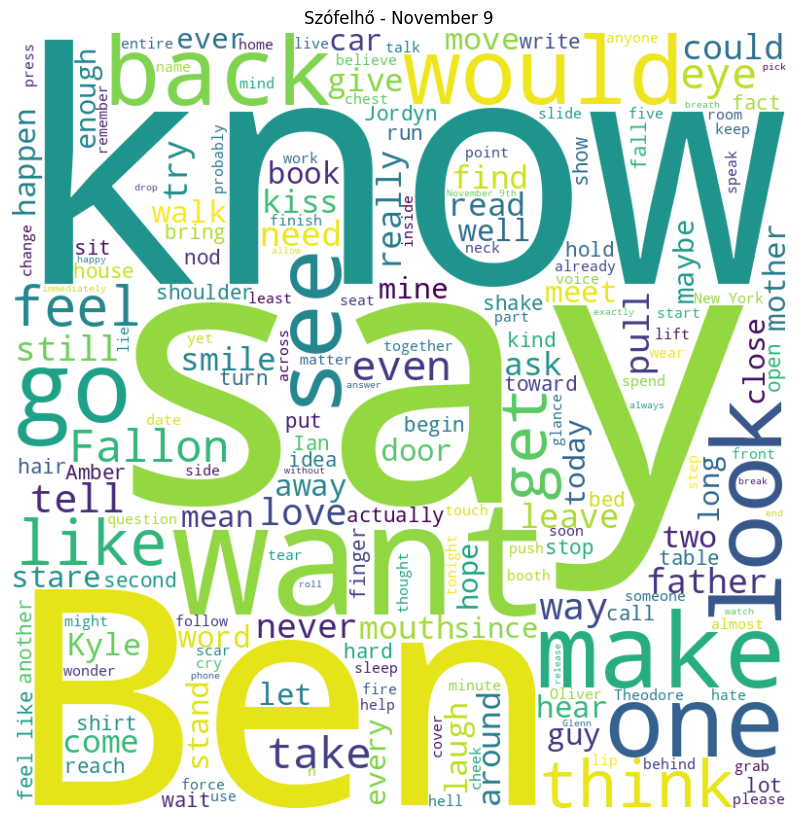


Szófelhő generálása: Reminders of Him


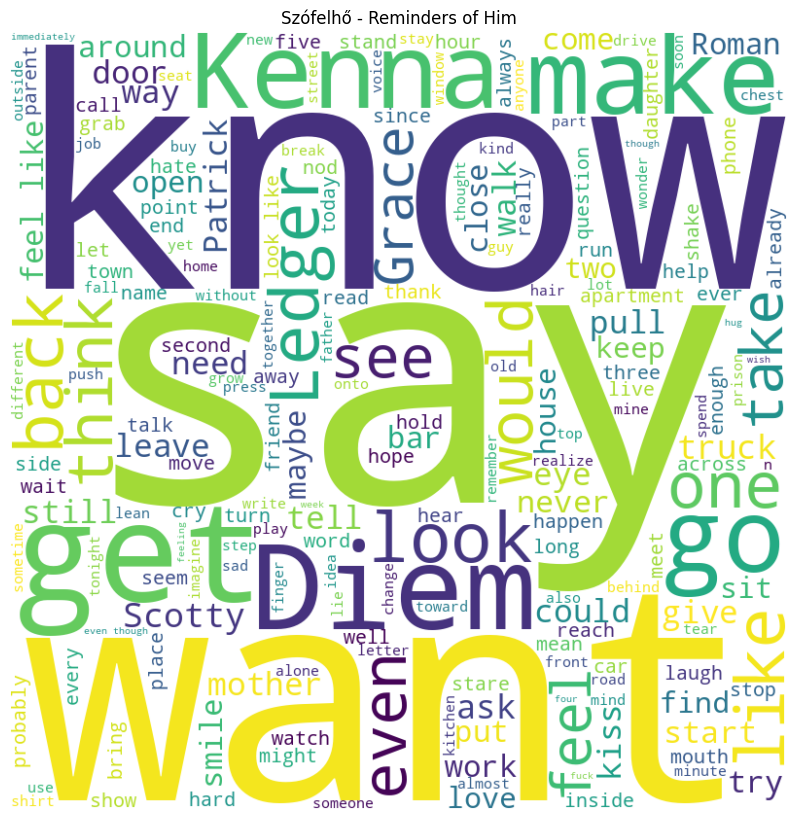


Szófelhő generálása: It Starts with Us


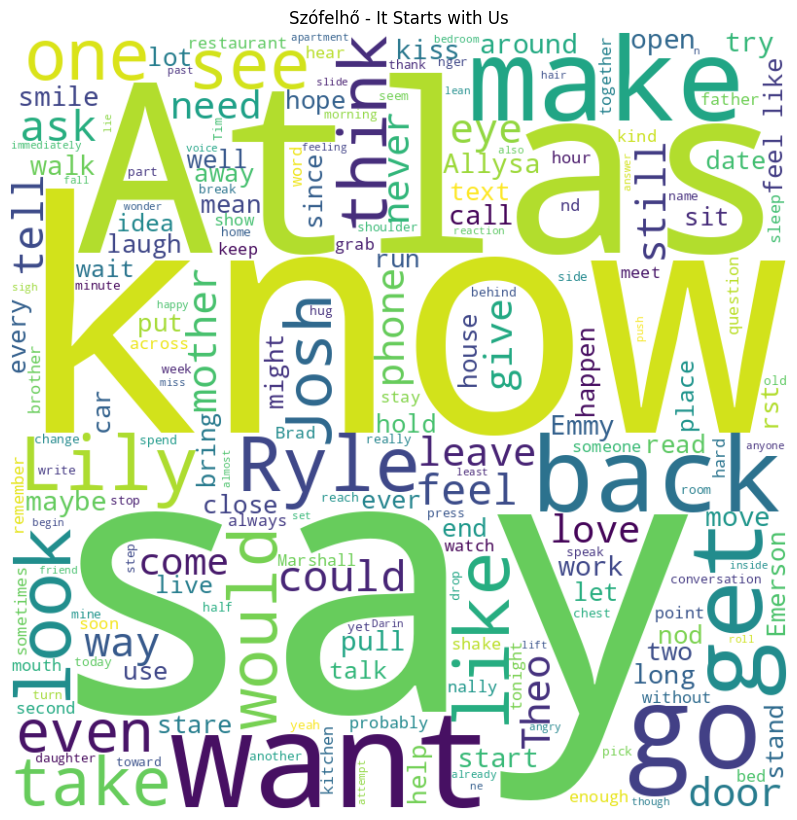


Szófelhő generálása: Regretting You


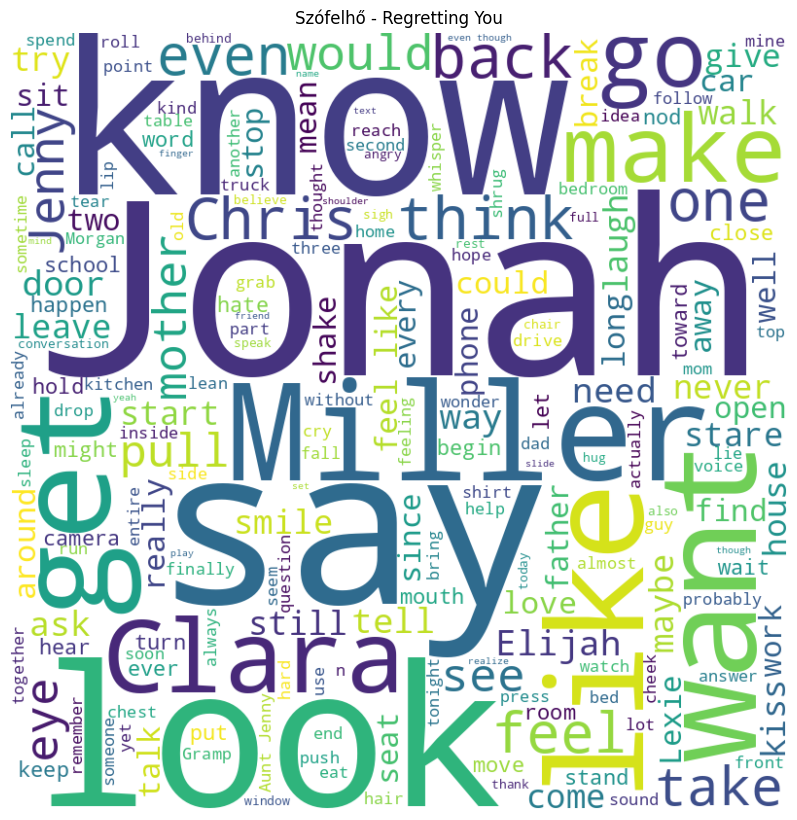


Szófelhő generálása: Verity


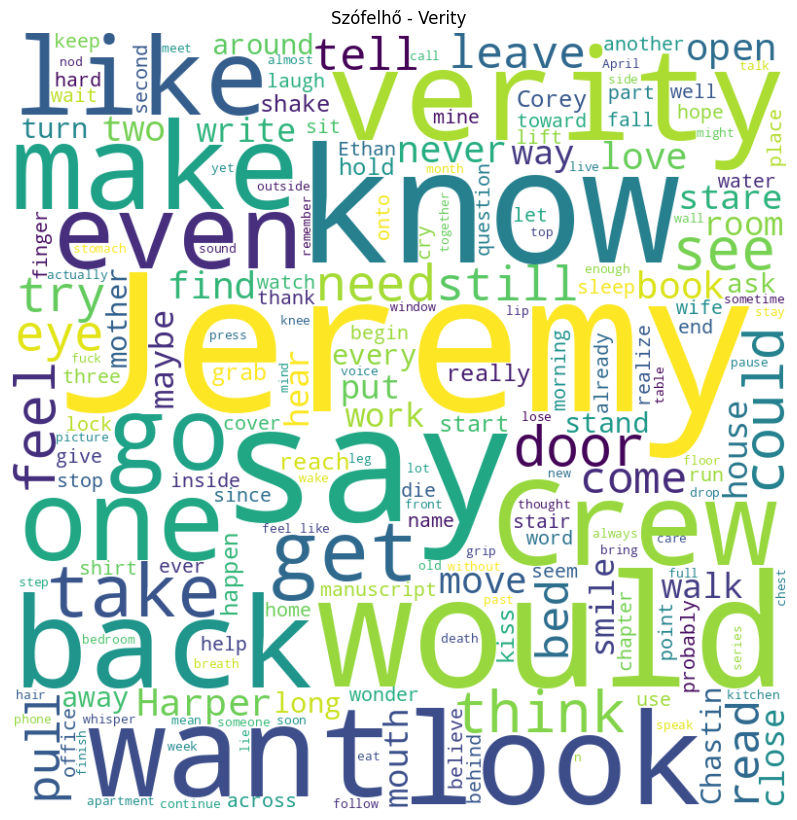


Szófelhő generálása: Ugly Love


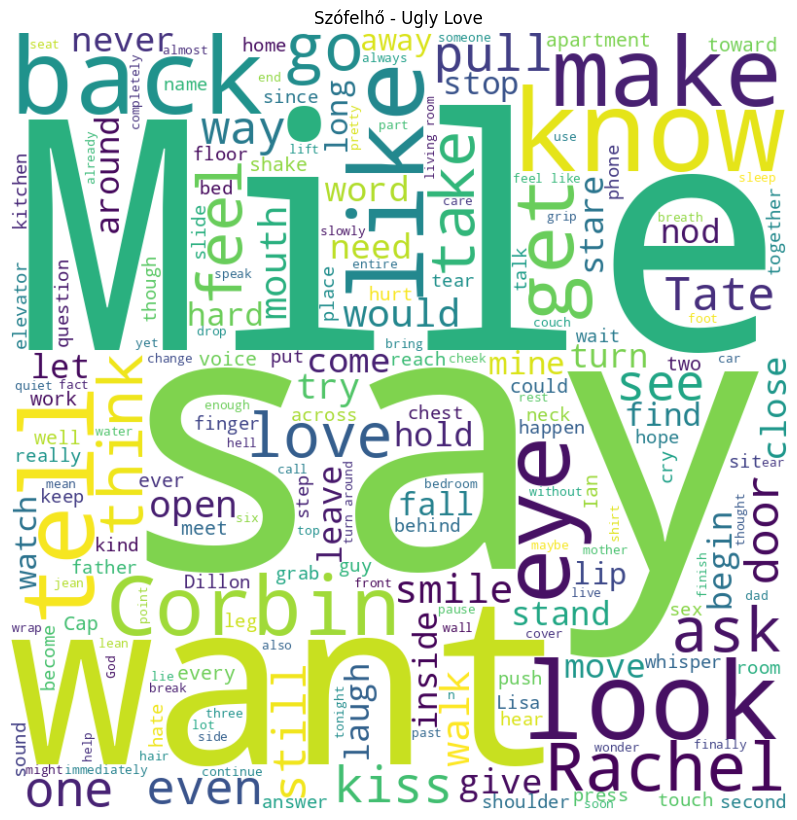


Szófelhő generálása: Hopeless


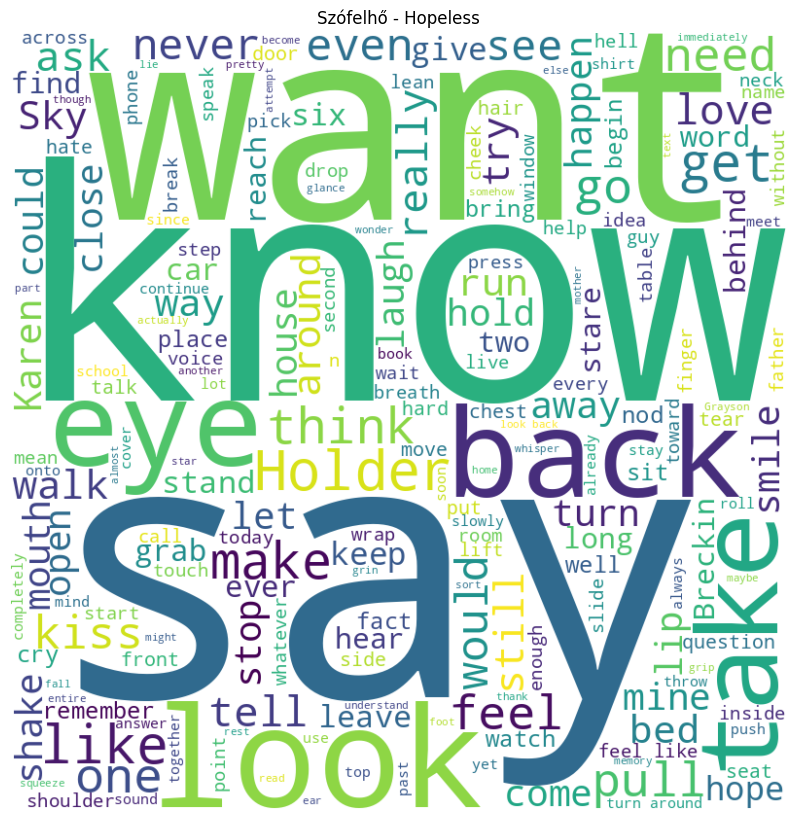


Szófelhő generálása: It Ends With Us


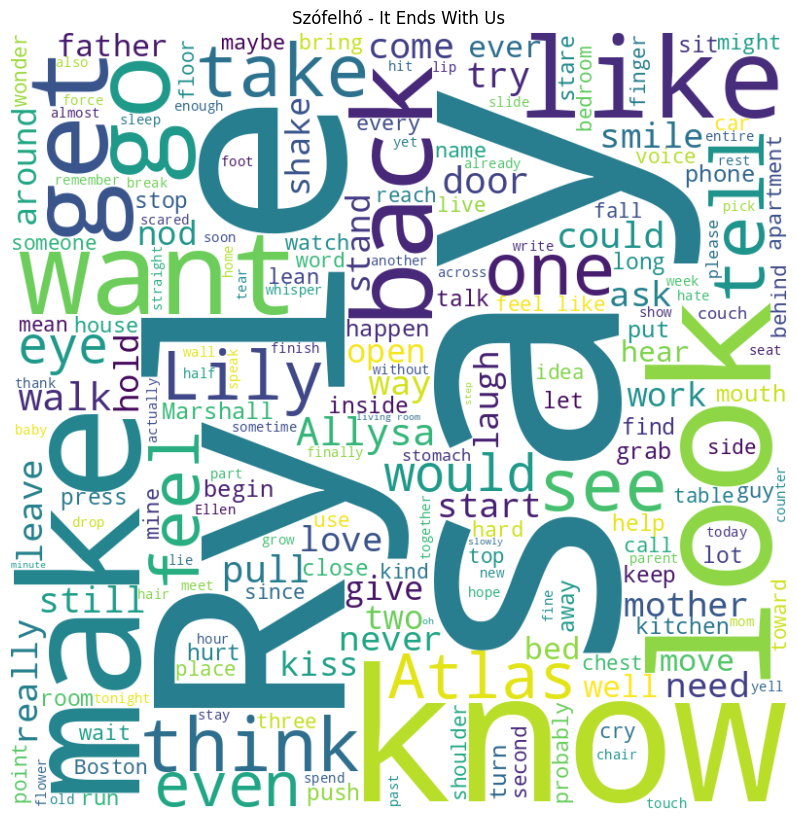

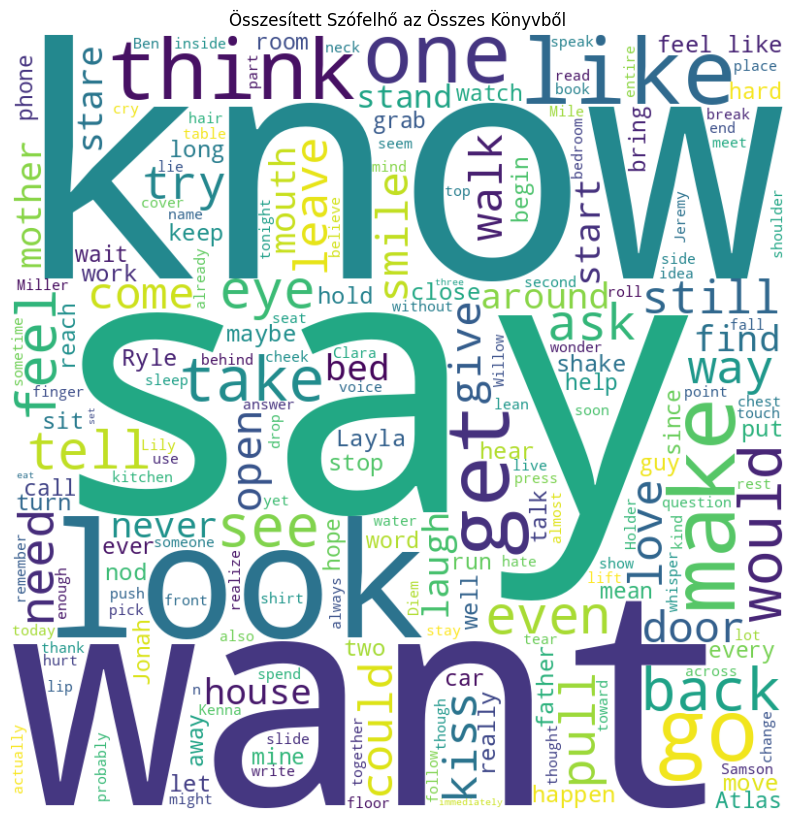

In [15]:
# Szófelhő generálása
def word_cloud(text, title):
    wc = WordCloud(
        width=800,
        height=800,
        background_color='white',
        stopwords=excl_words,
        min_font_size=10
    ).generate(text)

    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.tight_layout(pad=0)
    plt.show()

# Szófelhő minden könyvhöz
for doc in proc_doc:
    print(f"\nSzófelhő generálása: {doc['title']}")
    try:
        # A könyv szövegének összefűzése a lemmákból
        combined_text = ' '.join(doc['lemmas'])
        word_cloud(combined_text, f"Szófelhő - {doc['title']}")
    except Exception as e:
        print(f"Hiba történt a '{doc['title']}' könyvnél: {e}")

# Összesített szófelhő
try:
    all_text = ' '.join([' '.join(doc['lemmas']) for doc in proc_doc])
    word_cloud(all_text, "Összesített Szófelhő az Összes Könyvből")
except Exception as e:
    print(f"Hiba történt az összesített szófelhő generálása során: {e}")


In [18]:
# Témamodellezés (LDA)
def lda_topics(docs, n_topics=5, n_words=10):
    texts = [' '.join(doc['lemmas']) for doc in docs]
    vect = CountVectorizer(max_features=1000, stop_words='english')
    X = vect.fit_transform(texts)

    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(X)

    words = vect.get_feature_names_out()
    for i, topic in enumerate(lda.components_):
        top_words = [words[idx] for idx in topic.argsort()[-n_words:]]
        print(f"Téma {i+1}: {top_words}")

# Témamodellezés 5 téma
lda_topics(proc_doc, n_topics=5, n_words=10)


Téma 1: ['just', 'make', 'jeremy', 'feel', 'look', 'want', 'know', 'like', 'say', 'layla']
Téma 2: ['think', 'samson', 'make', 'feel', 'just', 'want', 'look', 'know', 'like', 'say']
Téma 3: ['ryle', 'feel', 'hand', 'want', 'make', 'look', 'just', 'like', 'know', 'say']
Téma 4: ['clara', 'just', 'want', 'feel', 'look', 'know', 'miller', 'say', 'like', 'jonah']
Téma 5: ['head', 'make', 'eye', 'like', 'hand', 'just', 'look', 'want', 'know', 'say']


In [19]:
# Témamodellezés minden könyvhöz külön
def lda_per_book(docs, n_topics=1, n_words=10):
    for doc in docs:
        print(f"\nTémamodellezés: {doc['title']}")
        try:
            text = ' '.join(doc['lemmas'])
            vect = CountVectorizer(max_features=1000, stop_words='english')
            X = vect.fit_transform([text])

            lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
            lda.fit(X)

            words = vect.get_feature_names_out()
            for i, topic in enumerate(lda.components_):
                top_words = [words[idx] for idx in topic.argsort()[-n_words:]]
                print(f"Téma {i+1}: {top_words}")
        except Exception as e:
            print(f"Hiba: {e}")

# Témamodellezés minden könyvre 1 témával
lda_per_book(proc_doc, n_topics=1, n_words=10)



Témamodellezés: Layla
Téma 1: ['ve', 'just', 'look', 'feel', 'want', 'know', 'willow', 'like', 'say', 'layla']

Témamodellezés: Heart Bones
Téma 1: ['think', 'make', 'feel', 'just', 'want', 'know', 'look', 'say', 'like', 'samson']

Témamodellezés: November 9
Téma 1: ['feel', 'hand', 'make', 'look', 'want', 'like', 'just', 'know', 'ben', 'say']

Témamodellezés: Reminders of Him
Téma 1: ['feel', 'make', 'kenna', 'diem', 'just', 'look', 'want', 'like', 'know', 'say']

Témamodellezés: It Starts with Us
Téma 1: ['time', 'lily', 'ryle', 'look', 'make', 'want', 'atlas', 'like', 'know', 'say']

Témamodellezés: Regretting You
Téma 1: ['clara', 'just', 'want', 'feel', 'look', 'know', 'miller', 'say', 'like', 'jonah']

Témamodellezés: Verity
Téma 1: ['hand', 'crew', 'make', 'want', 'like', 'verity', 'look', 'know', 'say', 'jeremy']

Témamodellezés: Ugly Love
Téma 1: ['tell', 'eye', 'just', 'hand', 'like', 'look', 'know', 'miles', 'want', 'say']

Témamodellezés: Hopeless
Téma 1: ['head', 'holder'

In [20]:
# Hangulatelemzés minden könyvre
def sentiment_per_book(docs):
    analyzer = SentimentIntensityAnalyzer()
    for doc in docs:
        print(f"\nHangulatelemzés: {doc['title']}")
        try:
            text = ' '.join(doc['sentences'][:500])  # Csak az első 500 mondatot
            sentiment = analyzer.polarity_scores(text)
            print(f"Hangulat: {sentiment}")
        except Exception as e:
            print(f"Hiba: {e}")

# Hangulatelemzés minden könyvhöz
sentiment_per_book(proc_doc)



Hangulatelemzés: Layla
Hangulat: {'neg': 0.068, 'neu': 0.797, 'pos': 0.135, 'compound': 0.9999}

Hangulatelemzés: Heart Bones
Hangulat: {'neg': 0.076, 'neu': 0.84, 'pos': 0.084, 'compound': 0.9893}

Hangulatelemzés: November 9
Hangulat: {'neg': 0.082, 'neu': 0.819, 'pos': 0.099, 'compound': 0.999}

Hangulatelemzés: Reminders of Him
Hangulat: {'neg': 0.077, 'neu': 0.827, 'pos': 0.095, 'compound': 0.9986}

Hangulatelemzés: It Starts with Us
Hangulat: {'neg': 0.07, 'neu': 0.835, 'pos': 0.095, 'compound': 0.9994}

Hangulatelemzés: Regretting You
Hangulat: {'neg': 0.073, 'neu': 0.803, 'pos': 0.124, 'compound': 0.9999}

Hangulatelemzés: Verity
Hangulat: {'neg': 0.089, 'neu': 0.819, 'pos': 0.093, 'compound': 0.939}

Hangulatelemzés: Ugly Love
Hangulat: {'neg': 0.062, 'neu': 0.828, 'pos': 0.11, 'compound': 0.9999}

Hangulatelemzés: Hopeless
Hangulat: {'neg': 0.068, 'neu': 0.819, 'pos': 0.112, 'compound': 0.9999}

Hangulatelemzés: It Ends With Us
Hangulat: {'neg': 0.09, 'neu': 0.788, 'pos': 0.

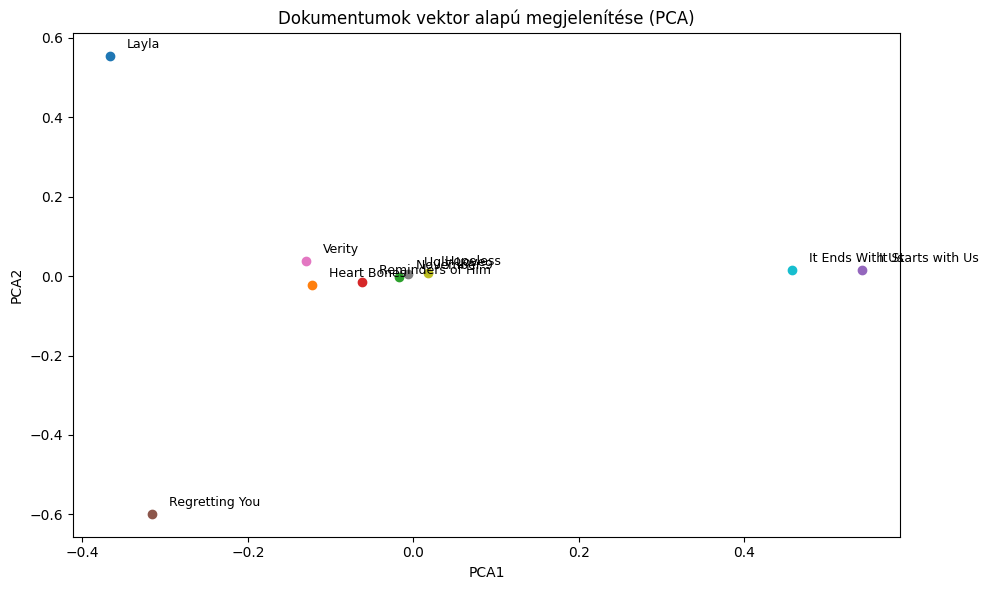

In [21]:
try:
    # Szövegek összefűzése
    texts = [' '.join(doc['lemmas']) for doc in proc_doc]
    titles = [doc['title'] for doc in proc_doc]

    # TF-IDF vektorok
    tfidf_vect = TfidfVectorizer(max_features=800, stop_words='english')
    tfidf_mtx = tfidf_vect.fit_transform(texts)

    # Dimenziócsökkentés PCA-val
    pca = PCA(n_components=2)
    reduced_mtx = pca.fit_transform(tfidf_mtx.toarray())

    # Vizualizáció
    plt.figure(figsize=(10, 6))
    for i, (x, y) in enumerate(reduced_mtx):
        plt.scatter(x, y)
        plt.text(x + 0.02, y + 0.02, titles[i], fontsize=9)
    plt.title("Dokumentumok vektor alapú megjelenítése (PCA)")
    plt.xlabel("PCA1")
    plt.ylabel("PCA2")
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"Hiba: {e}")


In [29]:
# Eredmények tárolása
results = []

# Minden könyv feldolgozása
for doc in proc_doc:
    title = doc['title']
    print(f"\nRegény: {title} - 3-gramok elemzése...\n")

    # N-gram mátrix beolvasása
    ngram_mtx = doc['ngram_mtx']

    # N-gram nevek generálása
    ngram_vect = CountVectorizer(ngram_range=(3, 3))
    ngram_vect.fit([' '.join(doc['lemmas'])])
    ngram_names = ngram_vect.get_feature_names_out()

    # N-gramok számlálása
    ngram_counts = ngram_mtx.sum(axis=0).tolist()
    ngram_counter = Counter(dict(zip(ngram_names, ngram_counts)))

    # TOP 10
    top_3_grams = ngram_counter.most_common(10)

    result = {'Könyv': title}
    for i, (ngram, count) in enumerate(top_3_grams, start=1):
        result[f'Top 3-gram {i}'] = f"{ngram} ({count}x)"

    results.append(result)

# Táblázat készítése
df = pd.DataFrame(results)
df.set_index('Könyv', inplace=True)

# Megjelenítés
print("\n3-gram táblázat\n")
display(df)



Regény: Layla - 3-gramok elemzése...


Regény: Heart Bones - 3-gramok elemzése...


Regény: November 9 - 3-gramok elemzése...


Regény: Reminders of Him - 3-gramok elemzése...


Regény: It Starts with Us - 3-gramok elemzése...


Regény: Regretting You - 3-gramok elemzése...


Regény: Verity - 3-gramok elemzése...


Regény: Ugly Love - 3-gramok elemzése...


Regény: Hopeless - 3-gramok elemzése...


Regény: It Ends With Us - 3-gramok elemzése...


3-gram táblázat



,Top 3-gram 1,Top 3-gram 2,Top 3-gram 3,Top 3-gram 4,Top 3-gram 5,Top 3-gram 6,Top 3-gram 7,Top 3-gram 8,Top 3-gram 9,Top 3-gram 10
Könyv,,,,,,,,,,
Layla,do not know (145x),do not want (109x),she do not (104x),not want to (70x),out of the (59x),do not even (52x),but do not (49x),you do not (46x),shake her head (38x),the grand room (36x)
Heart Bones,do not know (144x),he do not (88x),do not want (73x),out of the (57x),do not even (48x),not want to (47x),do not have (40x),you do not (40x),shake my head (38x),but do not (32x)
November 9,do not know (91x),do not want (68x),he do not (60x),not want to (50x),out of the (47x),you do not (47x),do not even (46x),have no idea (46x),in front of (44x),the fact that (41x)
Reminders of Him,do not know (157x),do not want (108x),she do not (72x),not want to (68x),do not have (58x),he do not (56x),out of the (53x),patrick and grace (53x),you do not (48x),do not even (45x)
It Starts with Us,do not know (121x),do not want (78x),he do not (77x),not want to (59x),do not have (51x),have no idea (44x),but do not (42x),as soon as (41x),out of the (40x),be go to (39x)
Regretting You,do not know (135x),do not want (113x),do not even (87x),not want to (83x),he do not (75x),out of the (60x),you do not (54x),do not have (49x),want to be (49x),but do not (45x)
Verity,he do not (92x),do not want (82x),do not know (66x),not want to (60x),out of the (50x),do not even (45x),it be not (39x),be able to (36x),want he to (33x),in front of (32x)
Ugly Love,he do not (119x),do not know (97x),do not want (90x),not want to (67x),the living room (47x),do not even (45x),as soon as (37x),shake my head (37x),do not have (36x),in front of (36x)
Hopeless,do not want (129x),do not know (127x),he do not (115x),not want to (85x),the fact that (80x),in front of (73x),look down at (69x),do not even (68x),look up at (63x),shake my head (60x)



Regény: Layla jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 363

Kategória: Spicy
Összes Spicy jelenet: 446

Kategória: Abuz
Összes Abuz jelenet: 291


Regény: Heart Bones jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 311

Kategória: Spicy
Összes Spicy jelenet: 246

Kategória: Abuz
Összes Abuz jelenet: 222


Regény: November 9 jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 470

Kategória: Spicy
Összes Spicy jelenet: 305

Kategória: Abuz
Összes Abuz jelenet: 333


Regény: Reminders of Him jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 419

Kategória: Spicy
Összes Spicy jelenet: 195

Kategória: Abuz
Összes Abuz jelenet: 305


Regény: It Starts with Us jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 471

Kategória: Spicy
Összes Spicy jelenet: 170

Kategória: Abuz
Összes Abuz jelenet: 305


Regény: Regretting You jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 515

Kategória: Spicy
Összes Spicy jelenet: 28

,Rom_jelenet,Spicy_jelenet,Abuz_jelenet
Cím,,,
Layla,363,446,291
Heart Bones,311,246,222
November 9,470,305,333
Reminders of Him,419,195,305
It Starts with Us,471,170,305
Regretting You,515,285,339
Verity,322,352,292
Ugly Love,618,398,379
Hopeless,749,546,464


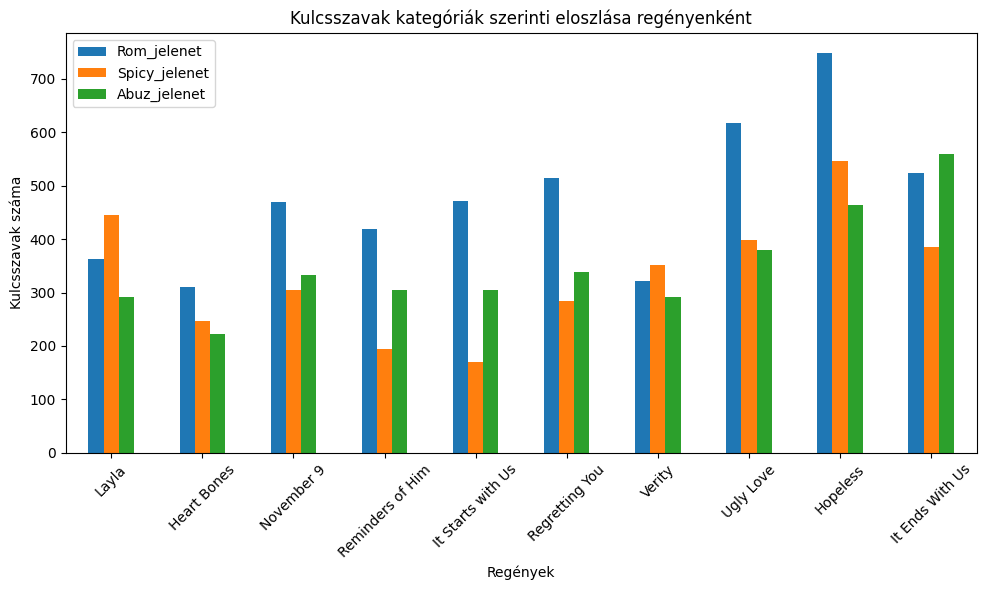

In [30]:
# Átlagos karakterek száma egy oldalon
char_per_pg = 2000

# Kulcsszavak
rom_kw = [
    "kiss", "love", "hug", "confess", "heart", "romantic", "passion", "embrace",
    "desire", "affection", "soulmate", "forever", "together", "marry", "proposal"
]

spicy_kw = [
    "moan", "whisper", "intense", "desire", "sensation", "pleasure", "skin", "body",
    "naked", "touch", "heat", "breath", "bed", "undress", "fantasy", "lust", "orgasm"
]

abv_kw = [
    "hit", "fight", "scream", "yell", "abuse", "violence", "cry", "hurt",
    "anger", "fear", "shout", "threat", "slap", "push", "punch", "pain",
    "force", "control", "rage", "dominate"
]

# Kulcsszó kategóriák
kw_cats = {
    "Rom": rom_kw,
    "Spicy": spicy_kw,
    "Abuz": abv_kw
}

# Jelenetek kategóriánkénti összesítése és vizualizációja
def analyze_scene_cnts(proc_doc):
    results = []
    for doc in proc_doc:
        title = doc['title']
        print(f"\nRegény: {title} jeleneteinek elemzése...\n")

        text = ' '.join(doc['lemmas'])

        book_res = {"Cím": title}

        for cat, kw_list in kw_cats.items():
            print(f"Kategória: {cat}")

            # Reguláris kifejezés az összes kulcsszóhoz
            regex = r'\b(?:' + '|'.join(kw_list) + r')\b'

            # Kulcsszavak számlálása
            matches = re.findall(regex, text.lower())
            total_occ = len(matches)

            # Kulcsszó-előfordulások száma az adott kategóriában
            book_res[f"{cat}_jelenet"] = total_occ

            print(f"Összes {cat} jelenet: {total_occ}\n")

        results.append(book_res)

    # Táblázat készítése
    df = pd.DataFrame(results)
    df.set_index('Cím', inplace=True)

    # Megejelítés
    display(df)

    # Adatok ábrázolása
    df.plot(kind="bar", figsize=(10, 6))
    plt.title("Kulcsszavak kategóriák szerinti eloszlása regényenként")
    plt.ylabel("Kulcsszavak száma")
    plt.xlabel("Regények")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Elemzés futtatása
analyze_scene_cnts(proc_doc)



Regény: Layla jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 363

Kategória: Spicy
Összes Spicy jelenet: 446

Kategória: Abuz
Összes Abuz jelenet: 291



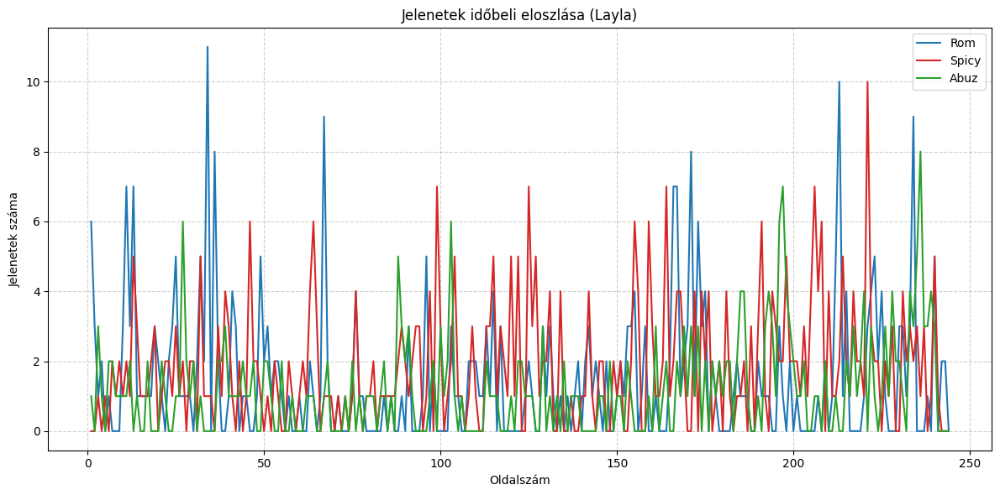


Regény: Heart Bones jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 311

Kategória: Spicy
Összes Spicy jelenet: 246

Kategória: Abuz
Összes Abuz jelenet: 222



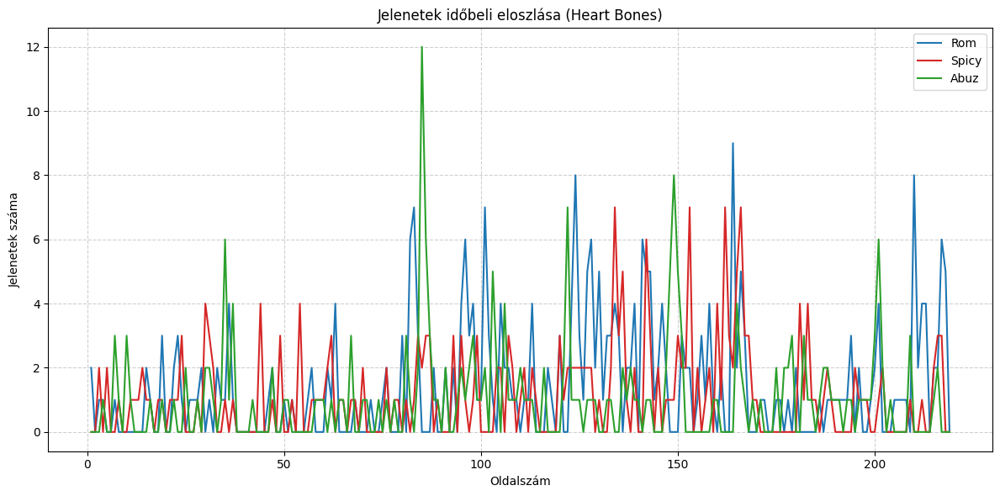


Regény: November 9 jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 470

Kategória: Spicy
Összes Spicy jelenet: 305

Kategória: Abuz
Összes Abuz jelenet: 333



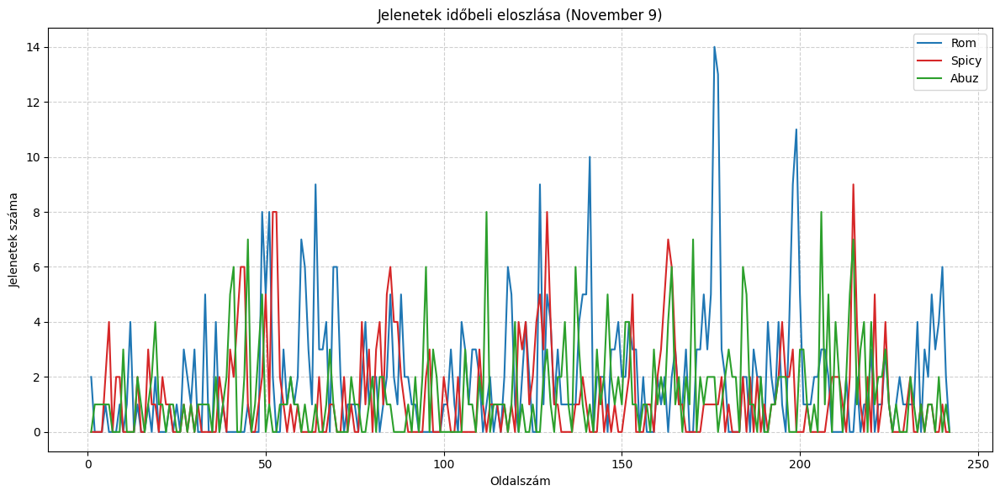


Regény: Reminders of Him jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 419

Kategória: Spicy
Összes Spicy jelenet: 195

Kategória: Abuz
Összes Abuz jelenet: 305



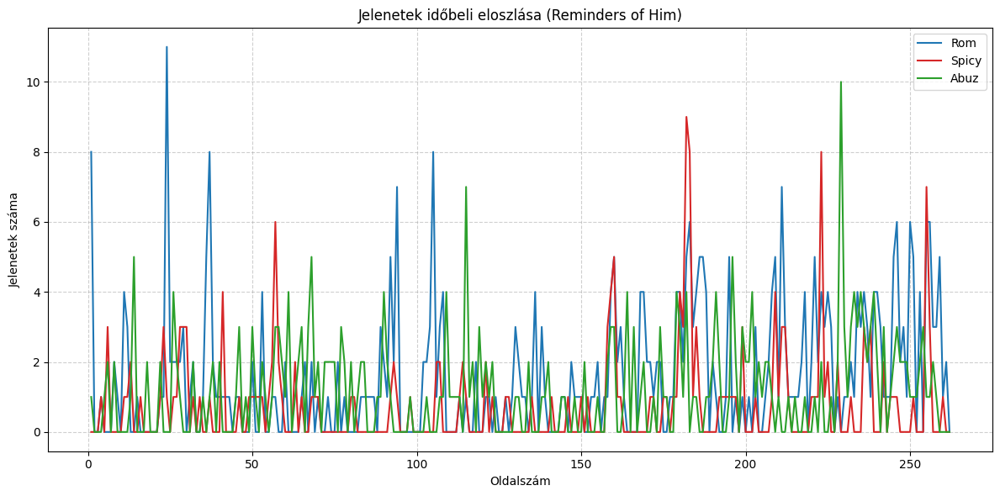


Regény: It Starts with Us jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 471

Kategória: Spicy
Összes Spicy jelenet: 170

Kategória: Abuz
Összes Abuz jelenet: 305



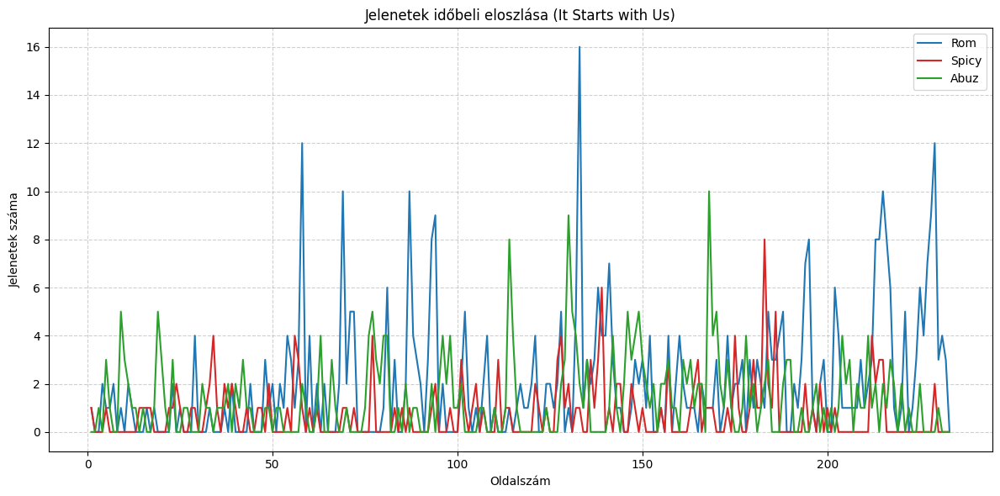


Regény: Regretting You jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 515

Kategória: Spicy
Összes Spicy jelenet: 285

Kategória: Abuz
Összes Abuz jelenet: 339



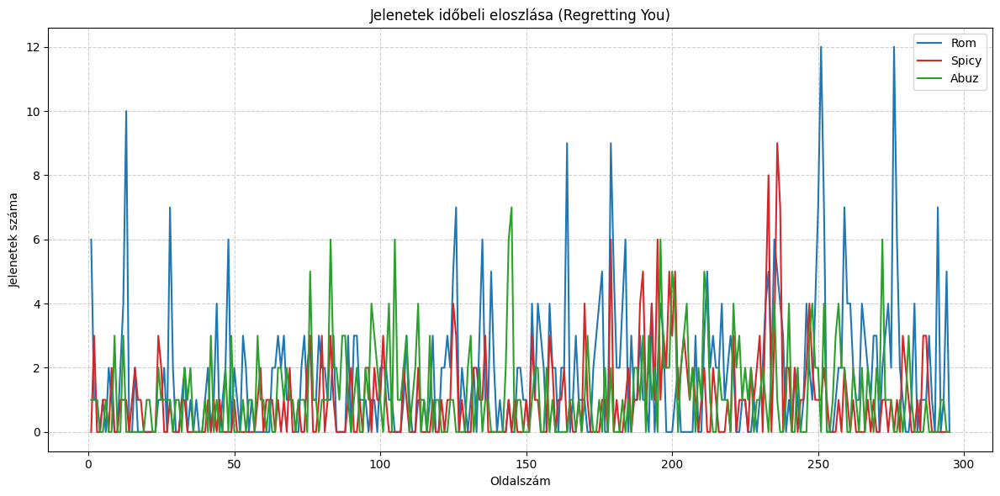


Regény: Verity jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 322

Kategória: Spicy
Összes Spicy jelenet: 352

Kategória: Abuz
Összes Abuz jelenet: 292



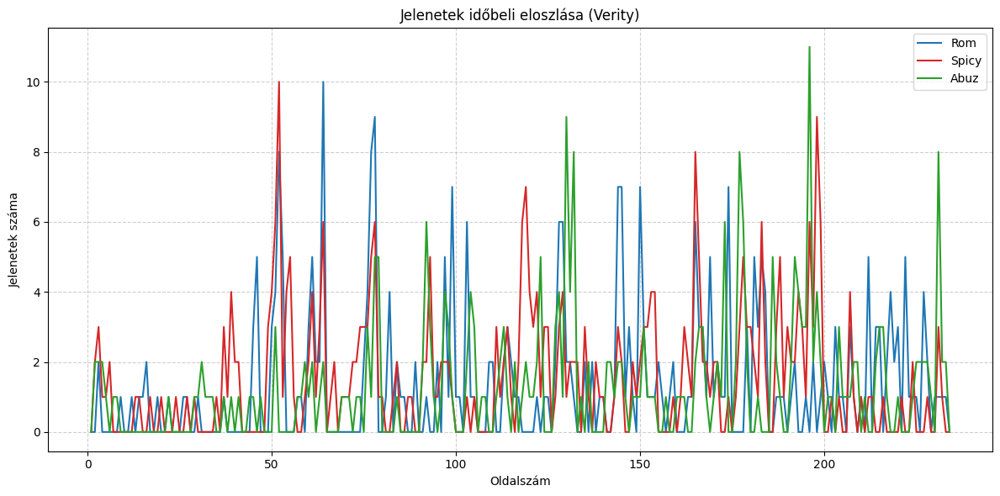


Regény: Ugly Love jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 618

Kategória: Spicy
Összes Spicy jelenet: 398

Kategória: Abuz
Összes Abuz jelenet: 379



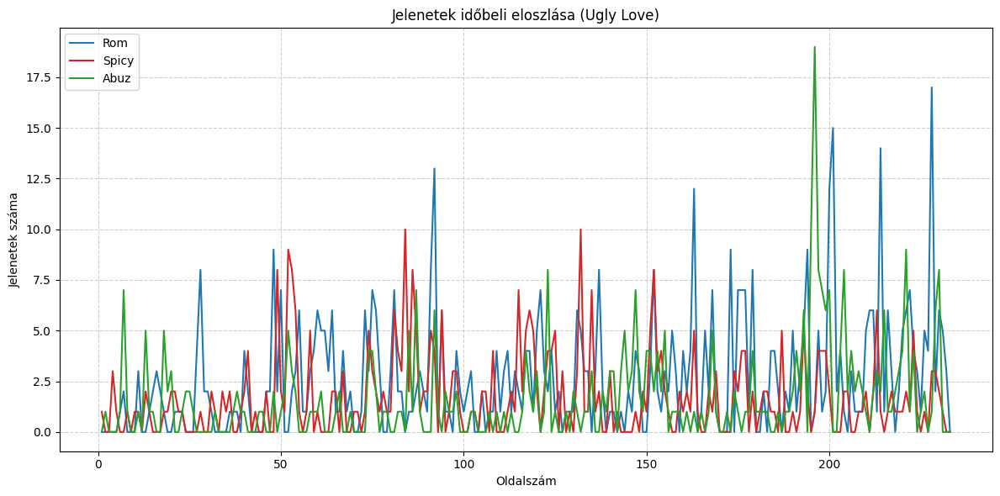


Regény: Hopeless jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 749

Kategória: Spicy
Összes Spicy jelenet: 546

Kategória: Abuz
Összes Abuz jelenet: 464



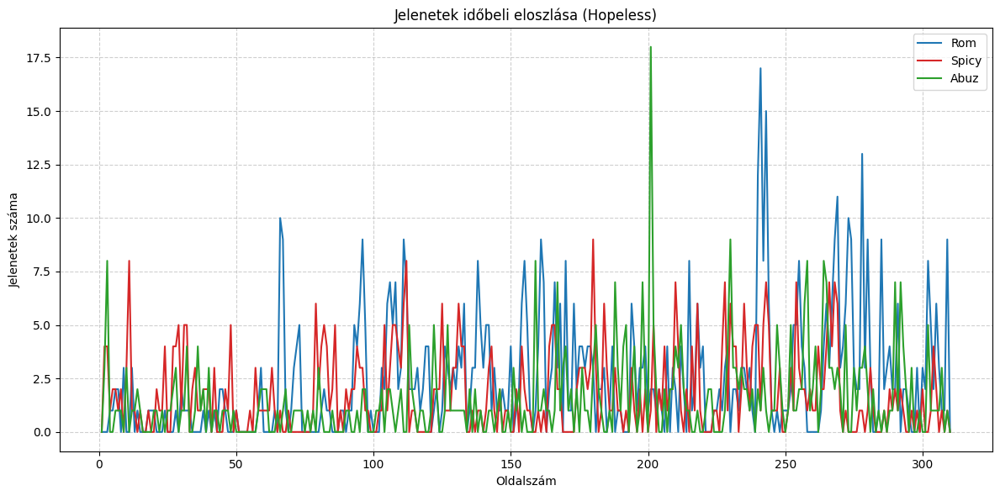


Regény: It Ends With Us jeleneteinek elemzése...

Kategória: Rom
Összes Rom jelenet: 523

Kategória: Spicy
Összes Spicy jelenet: 385

Kategória: Abuz
Összes Abuz jelenet: 559



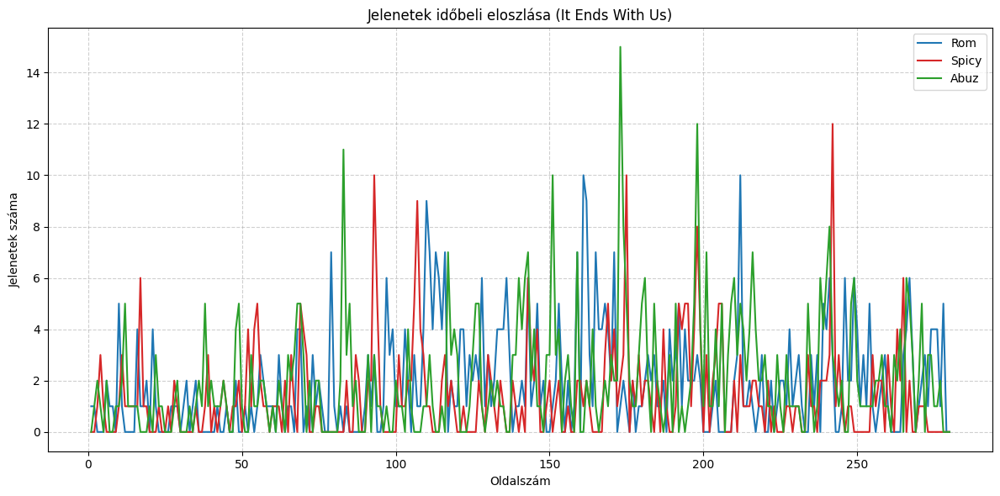

In [32]:
# Jelenetek időbeli eloszlásának elemzése és vizualizációja
def analyze_timeline(proc_doc):
    for doc in proc_doc:
        title = doc['title']
        print(f"\nRegény: {title} jeleneteinek elemzése...\n")

        text = ' '.join(doc['lemmas'])

        # Oldalszámokhoz tartozó adatstruktúra
        pg_timeline = {
            "Pg": list(range(1, (len(text) // char_per_pg) + 2)),
            "Rom": [0] * ((len(text) // char_per_pg) + 1),
            "Spicy": [0] * ((len(text) // char_per_pg) + 1),
            "Abuz": [0] * ((len(text) // char_per_pg) + 1)
        }

        for cat, kw_list in kw_cats.items():
            print(f"Kategória: {cat}")

            # Reguláris kifejezés az összes kulcsszóhoz
            regex = r'\b(?:' + '|'.join(kw_list) + r')\b'

            # Kulcsszavak előfordulási helyei
            matches = [match.start() for match in re.finditer(regex, text.lower())]
            if matches:
                pages = [pos // char_per_pg + 1 for pos in matches]

                for pg in pages:
                    if pg < len(pg_timeline[cat]):
                        pg_timeline[cat][pg-1] += 1

            print(f"Összes {cat} jelenet: {len(matches)}\n")

        # Adatok megjelenítése vonaldiagramon
        plt.figure(figsize=(12, 6))
        plt.plot(pg_timeline["Pg"], pg_timeline["Rom"], label="Rom", color="tab:blue")
        plt.plot(pg_timeline["Pg"], pg_timeline["Spicy"], label="Spicy", color="tab:red")
        plt.plot(pg_timeline["Pg"], pg_timeline["Abuz"], label="Abuz", color="tab:green")

        plt.xlabel("Oldalszám")
        plt.ylabel("Jelenetek száma")
        plt.title(f"Jelenetek időbeli eloszlása ({title})")
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.show()

# Futtassuk az elemzést
analyze_timeline(proc_doc)


Regény: Layla érzelmi ívének elemzése...



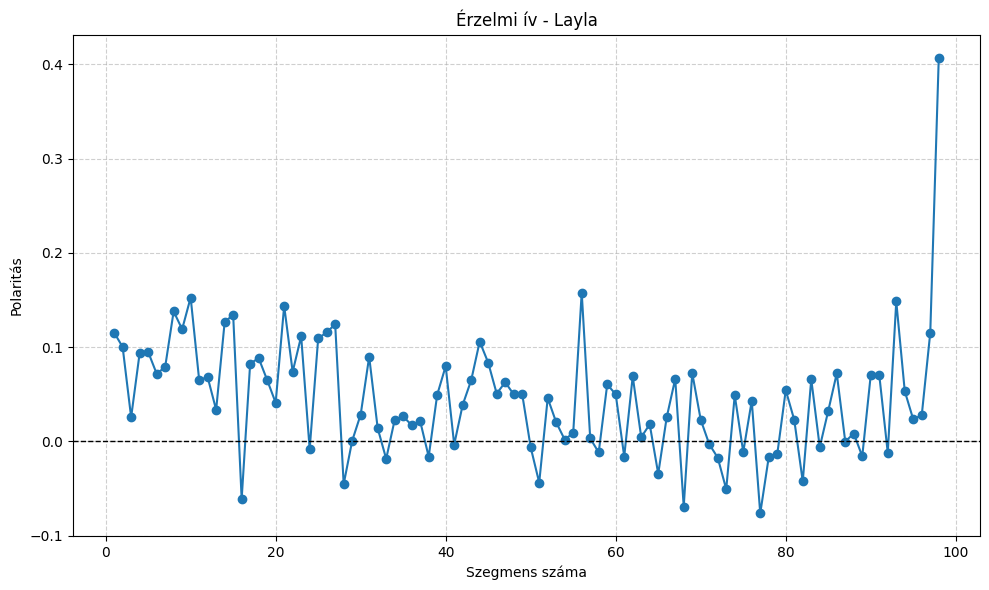


Regény: Heart Bones érzelmi ívének elemzése...



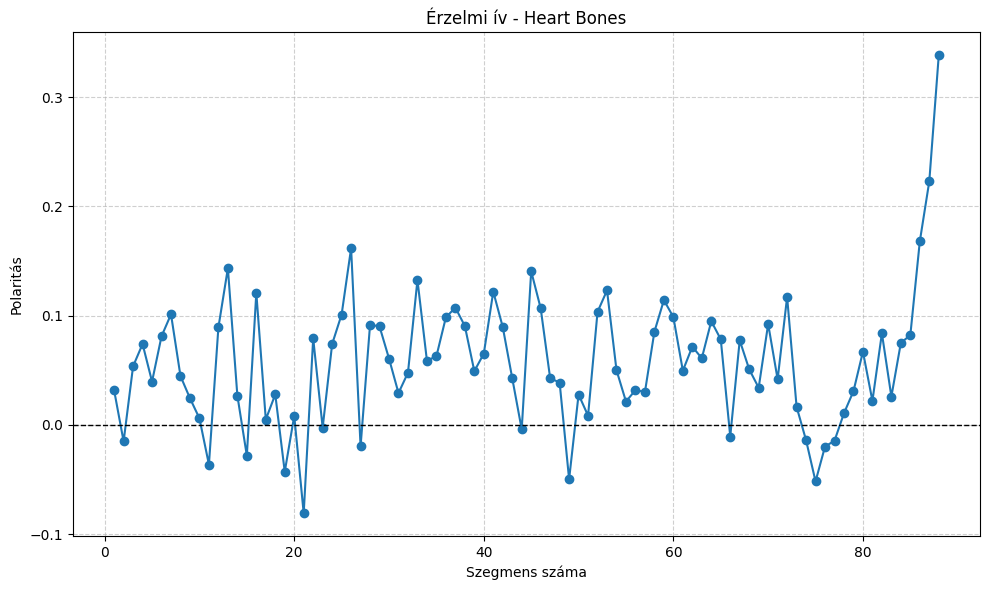


Regény: November 9 érzelmi ívének elemzése...



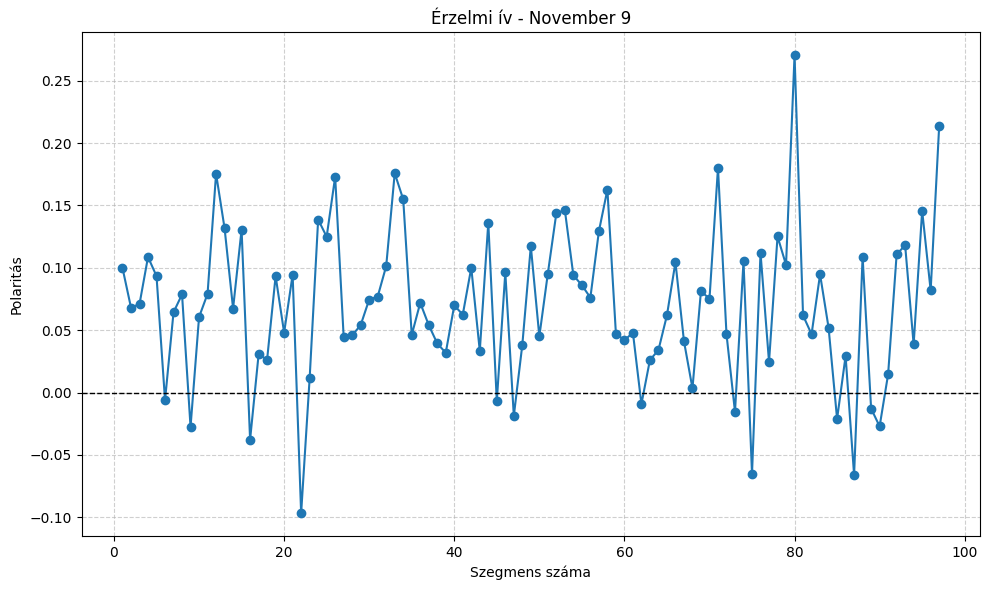


Regény: Reminders of Him érzelmi ívének elemzése...



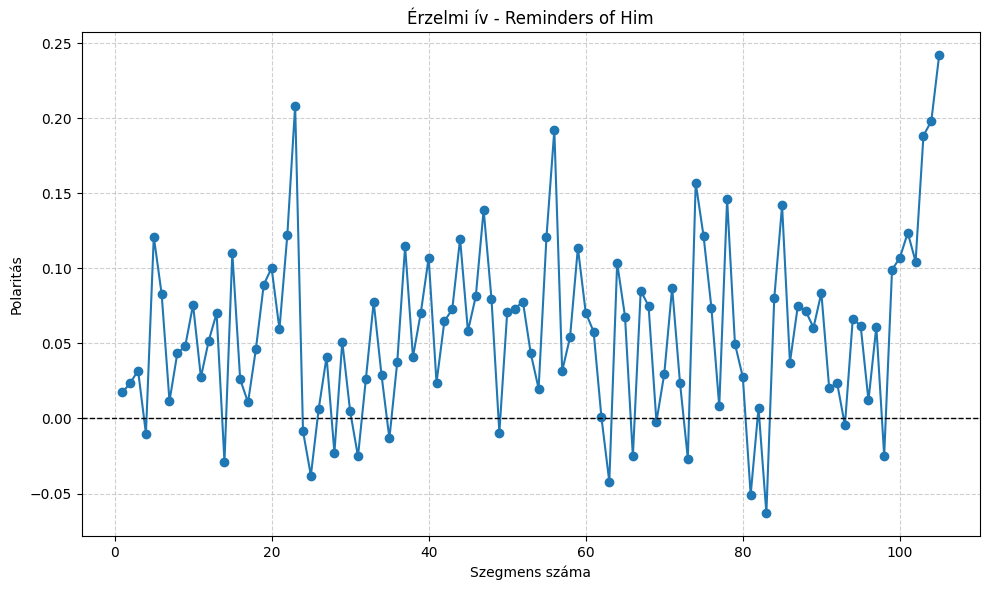


Regény: It Starts with Us érzelmi ívének elemzése...



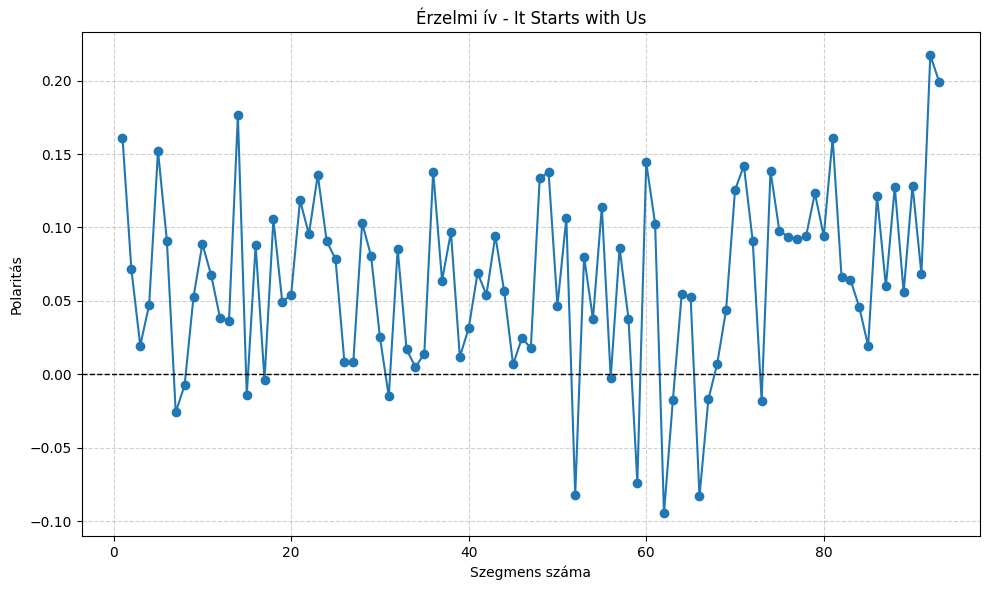


Regény: Regretting You érzelmi ívének elemzése...



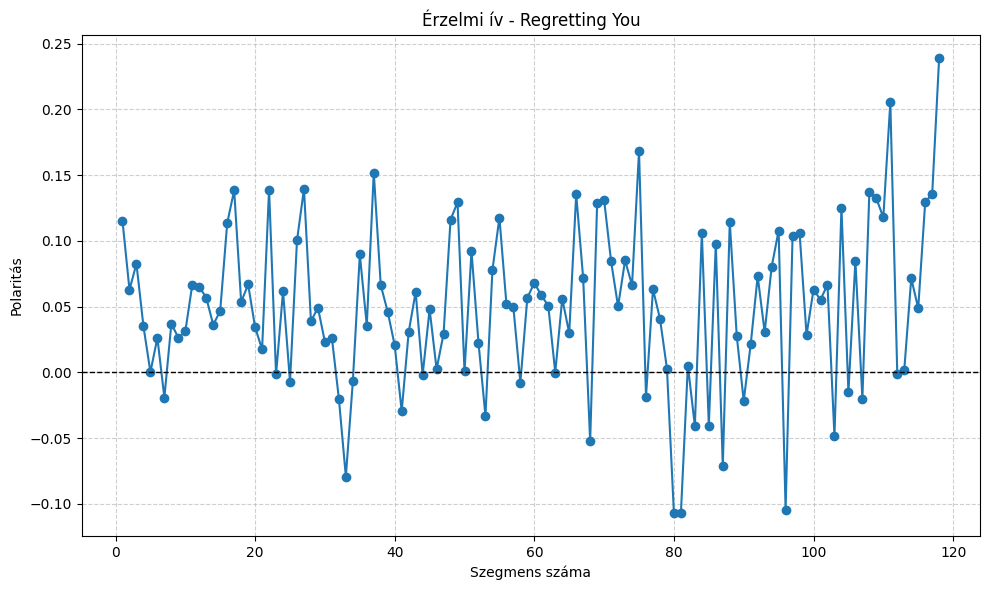


Regény: Verity érzelmi ívének elemzése...



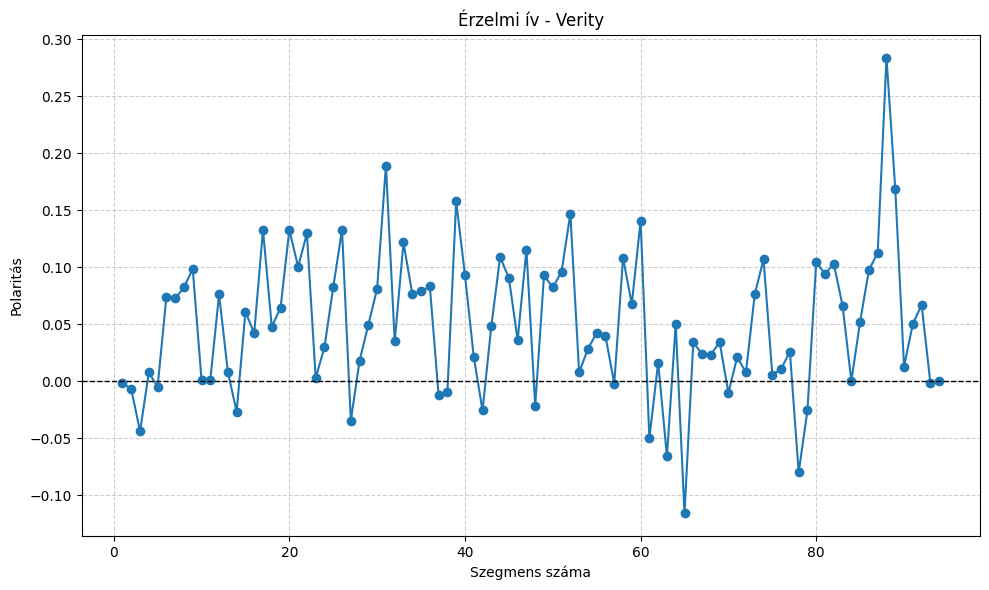


Regény: Ugly Love érzelmi ívének elemzése...



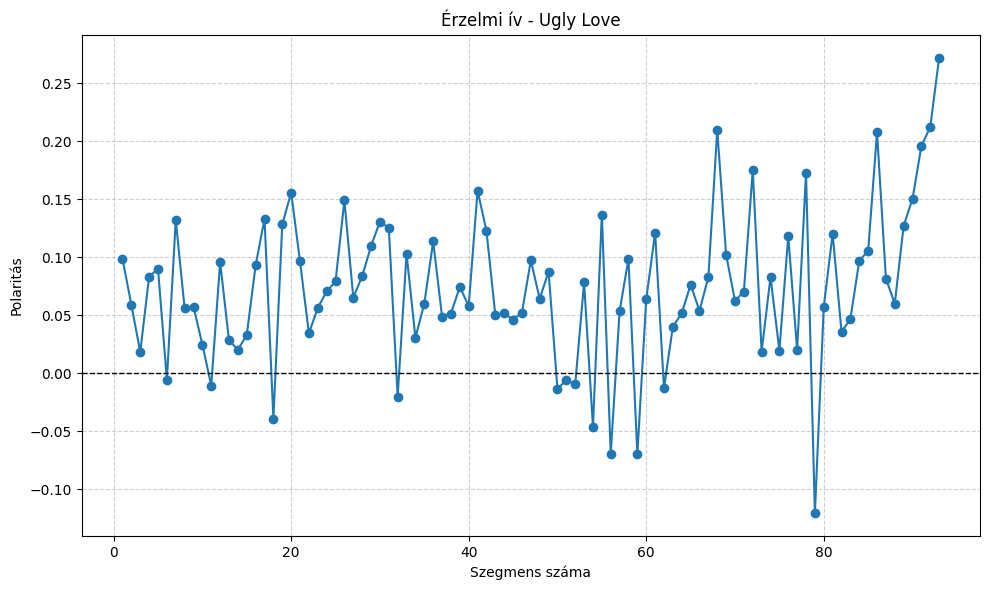


Regény: Hopeless érzelmi ívének elemzése...



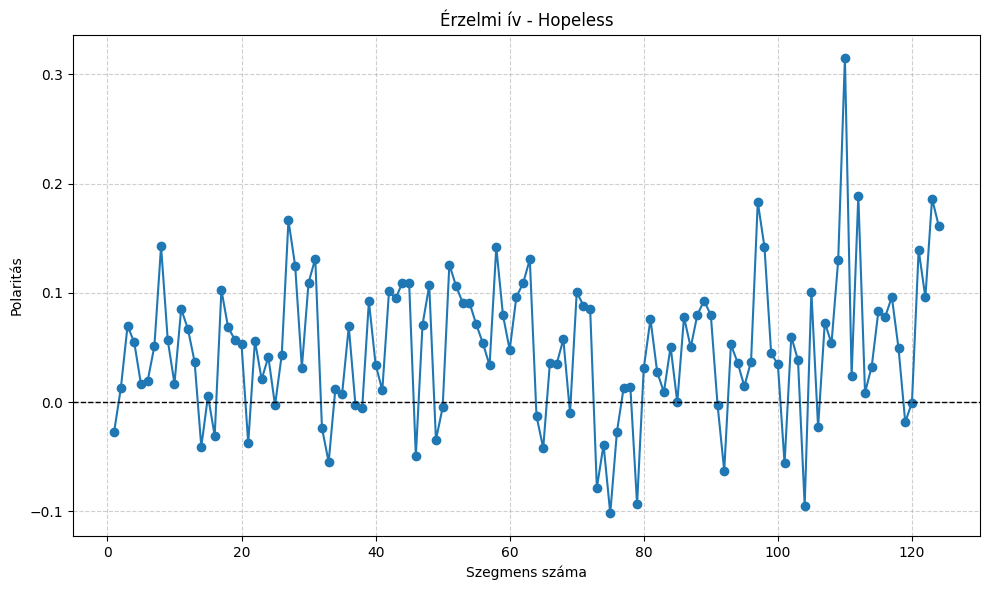


Regény: It Ends With Us érzelmi ívének elemzése...



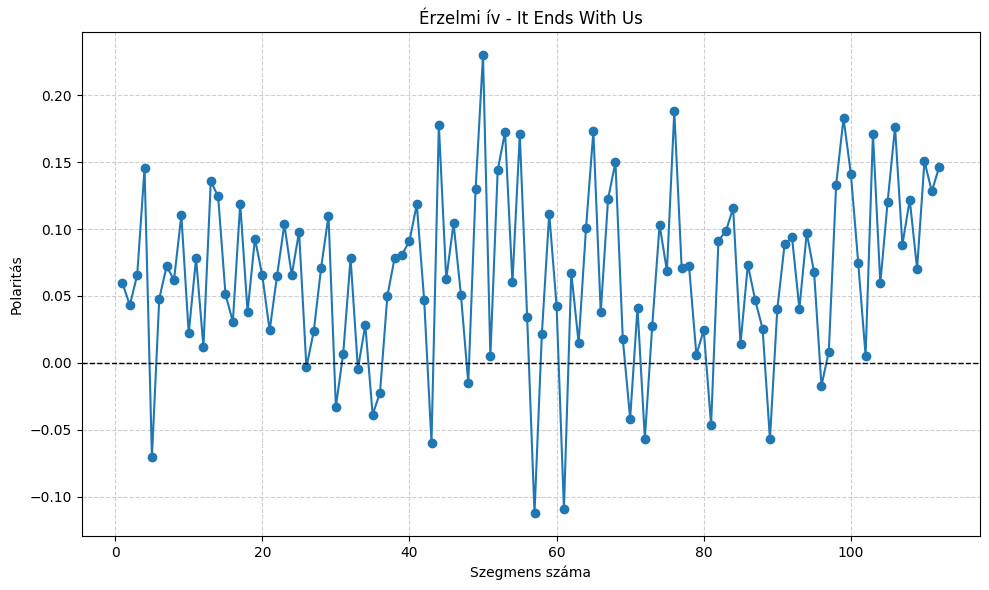

In [34]:
# Szöveges szegmensek mérete
char_per_chunk = 5000
# Érzelmi ív elemzése és vizualizációja
def analyze_emotional_arc(proc_doc):
    for doc in proc_doc:
        title = doc['title']
        print(f"\nRegény: {title} érzelmi ívének elemzése...\n")

        text = ' '.join(doc['lemmas'])

        # Szöveg bontása szegmensekre
        chunks = [text[j:j + char_per_chunk] for j in range(0, len(text), char_per_chunk)]
        sentiments = []

        # Polaritás kiszámítása
        for idx, chunk in enumerate(chunks):
            try:
                sentiment = TextBlob(chunk).sentiment.polarity
                sentiments.append(sentiment)
            except Exception as e:
                print(f"Hiba a(z) {idx + 1}. szegmens érzelmi elemzésekor: {e}")
                sentiments.append(0)
        # Érzelmi ív vizualizálása
        plt.figure(figsize=(10, 6))
        plt.plot(range(1, len(sentiments) + 1), sentiments, label='Polaritás', marker='o', color='tab:blue')

        plt.xlabel("Szegmens száma")
        plt.ylabel("Polaritás")
        plt.title(f"Érzelmi ív - {title}")
        plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.show()

# Futtatás
analyze_emotional_arc(proc_doc)



Regény: Layla csókjelenetek elemzése...

- Összes kulcsszó előfordulás: 224
- Csókjelenetek hozzávetőleges oldalai: [2, 7, 8, 9, 10, 11, 12, 13, 14, 15] (első 10 oldal)

---


Regény: Heart Bones csókjelenetek elemzése...

- Összes kulcsszó előfordulás: 253
- Csókjelenetek hozzávetőleges oldalai: [3, 13, 17, 22, 23, 31, 33, 34, 35, 36] (első 10 oldal)

---


Regény: November 9 csókjelenetek elemzése...

- Összes kulcsszó előfordulás: 323
- Csókjelenetek hozzávetőleges oldalai: [3, 9, 11, 12, 13, 14, 15, 22, 23, 26] (első 10 oldal)

---


Regény: Reminders of Him csókjelenetek elemzése...

- Összes kulcsszó előfordulás: 279
- Csókjelenetek hozzávetőleges oldalai: [4, 10, 11, 12, 20, 23, 24, 25, 26, 27] (első 10 oldal)

---


Regény: It Starts with Us csókjelenetek elemzése...

- Összes kulcsszó előfordulás: 242
- Csókjelenetek hozzávetőleges oldalai: [3, 5, 17, 19, 20, 26, 28, 29, 31, 35] (első 10 oldal)

---


Regény: Regretting You csókjelenetek elemzése...

- Összes kulcsszó előford

,Csókjelenet db,Első csók oldal,Csók oldal (első 10)
Cím,,,
Layla,224,2,"[2, 7, 8, 9, 10, 11, 12, 13, 14, 15]"
Heart Bones,253,3,"[3, 13, 17, 22, 23, 31, 33, 34, 35, 36]"
November 9,323,3,"[3, 9, 11, 12, 13, 14, 15, 22, 23, 26]"
Reminders of Him,279,4,"[4, 10, 11, 12, 20, 23, 24, 25, 26, 27]"
It Starts with Us,242,3,"[3, 5, 17, 19, 20, 26, 28, 29, 31, 35]"
Regretting You,348,2,"[2, 5, 7, 9, 12, 13, 17, 18, 19, 20]"
Verity,224,3,"[3, 11, 12, 14, 24, 25, 30, 34, 35, 50]"
Ugly Love,476,3,"[3, 14, 15, 16, 20, 21, 22, 24, 25, 26]"
Hopeless,606,3,"[3, 4, 6, 8, 9, 10, 11, 12, 16, 17]"


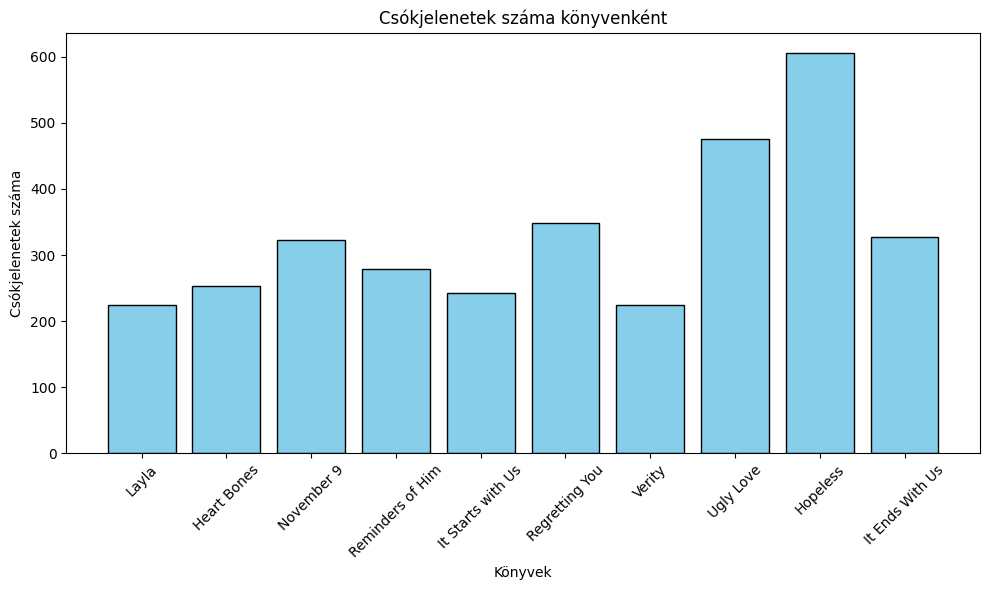

In [39]:
# Csókjelenet kulcsszavak
kiss_kw = [
    "kiss", "kissing", "kissed", "kisses", "peck", "smooch", "make out", "lip",
    "lips", "mouth", "french kiss", "forehead kiss", "cheek kiss", "passionate kiss",
    "romantic kiss", "soft kiss", "slow kiss", "deep kiss", "tender kiss",
    "intense kiss", "gentle kiss", "sweet kiss", "spontaneous kiss", "sudden kiss",
    "first kiss", "secret kiss", "unforgettable kiss", "fervent kiss",
    "quick kiss", "intoxicating kiss", "electric kiss", "explosive kiss",
    "brief kiss", "hidden kiss", "unexpected kiss", "luscious kiss",
    "soft peck", "sweet peck", "whispered kiss", "firework kiss",
    "impulsive kiss", "delicate kiss"
]

# Átlagos karakterek száma egy oldalon
char_per_pg = 2000

# Csókjelenetek elemzése
kiss_data = []
for doc in proc_doc:
    title = doc['title']
    print(f"\nRegény: {title} csókjelenetek elemzése...\n")

    text = ' '.join(doc['lemmas'])

    # Kulcsszavak pozícióinak keresése
    regex = r'\b(?:' + '|'.join(kiss_kw) + r')\b'
    matches = [(match.start(), match.group()) for match in re.finditer(regex, text.lower())]

    # Csókjelenetek száma és oldalszámok meghatározása
    kiss_cnt = len(matches)
    kiss_pos = [match[0] for match in matches]
    kiss_pgs = sorted(set(pos // char_per_pg + 1 for pos in kiss_pos))

    # Adatok tárolása
    kiss_data.append({
        'Cím': title,
        'Csókjelenet db': kiss_cnt,
        'Első csók oldal': kiss_pgs[0] if kiss_pgs else 'Nincs',
        'Csók oldal (első 10)': kiss_pgs[:10] if kiss_pgs else 'Nincs'
    })

    # Eredmények
    print(f"- Összes kulcsszó előfordulás: {kiss_cnt}")
    print(f"- Csókjelenetek hozzávetőleges oldalai: {kiss_pgs[:10]} (első 10 oldal)")  # Csak az első 10-et jelenítjük meg
    print("\n---\n")

# Táblázat készítése
df = pd.DataFrame(kiss_data)
df.set_index('Cím', inplace=True)

# Megjelenítás
print("\nCsókjelenetek táblázat\n")
display(df)

# Csókjelenetek számának vizualizálása
plt.figure(figsize=(10, 6))
plt.bar(df.index, df['Csókjelenet db'], color='skyblue', edgecolor='black')

plt.xlabel("Könyvek")
plt.ylabel("Csókjelenetek száma")
plt.title("Csókjelenetek száma könyvenként")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Regény: Layla klisék elemzése...

- Összes klisé előfordulás: 1
- Klisék hozzávetőleges oldalai: [233] (első 10 oldal)

---


Regény: Heart Bones klisék elemzése...

- Összes klisé előfordulás: 0
- Klisék hozzávetőleges oldalai: [] (első 10 oldal)

---


Regény: November 9 klisék elemzése...

- Összes klisé előfordulás: 3
- Klisék hozzávetőleges oldalai: [80, 146, 162] (első 10 oldal)

---


Regény: Reminders of Him klisék elemzése...

- Összes klisé előfordulás: 0
- Klisék hozzávetőleges oldalai: [] (első 10 oldal)

---


Regény: It Starts with Us klisék elemzése...

- Összes klisé előfordulás: 3
- Klisék hozzávetőleges oldalai: [228, 229] (első 10 oldal)

---


Regény: Regretting You klisék elemzése...

- Összes klisé előfordulás: 1
- Klisék hozzávetőleges oldalai: [56] (első 10 oldal)

---


Regény: Verity klisék elemzése...

- Összes klisé előfordulás: 5
- Klisék hozzávetőleges oldalai: [45, 53] (első 10 oldal)

---


Regény: Ugly Love klisék elemzése...

- Összes klisé előfordulá

,Klisék db,Első klisé oldal,Klisék oldal (első 10)
Cím,,,
Layla,1,233,[233]
Heart Bones,0,Nincs,Nincs
November 9,3,80,"[80, 146, 162]"
Reminders of Him,0,Nincs,Nincs
It Starts with Us,3,228,"[228, 229]"
Regretting You,1,56,[56]
Verity,5,45,"[45, 53]"
Ugly Love,1,76,[76]
Hopeless,3,8,"[8, 59, 131]"


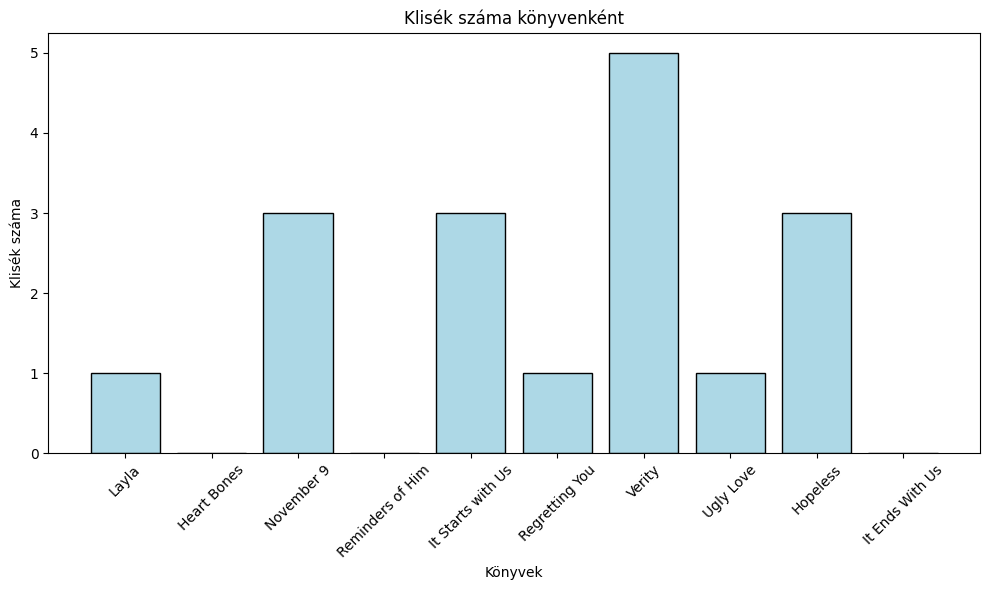

In [42]:
# Klisék kulcsszavai
cliche_kw = [
    "love at first sight", "star-crossed lovers", "bad boy", "childhood friends",
    "enemies to lovers", "forbidden love", "unrequited love", "perfect storm",
    "against all odds", "dark past", "soulmate", "heartbreak", "tragic end",
    "savior complex", "prince charming", "lost everything", "epic romance"
]

# Átlagos karakterek száma egy oldalon
char_per_pg = 2000

# Klisék elemzése
cliche_data = []
for doc in proc_doc:
    title = doc['title']
    print(f"\nRegény: {title} klisék elemzése...\n")

    text = ' '.join(doc['lemmas'])

    # Kulcsszavak pozíciója
    regex = r'\b(?:' + '|'.join(re.escape(kw) for kw in cliche_kw) + r')\b'
    matches = [(match.start(), match.group()) for match in re.finditer(regex, text.lower())]

    # Klisék száma és oldalszámok meghatározása
    cliche_cnt = len(matches)
    cliche_pos = [match[0] for match in matches]
    cliche_pgs = sorted(set(pos // char_per_pg + 1 for pos in cliche_pos))

    # Adatok tárolása
    cliche_data.append({
        'Cím': title,
        'Klisék db': cliche_cnt,
        'Első klisé oldal': cliche_pgs[0] if cliche_pgs else 'Nincs',
        'Klisék oldal (első 10)': cliche_pgs[:10] if cliche_pgs else 'Nincs'
    })

    # Eredmények
    print(f"- Összes klisé előfordulás: {cliche_cnt}")
    print(f"- Klisék hozzávetőleges oldalai: {cliche_pgs[:10]} (első 10 oldal)")  # Csak az első 10-et jelenítjük meg
    print("\n---\n")

# Táblázat készítése
df = pd.DataFrame(cliche_data)
df.set_index('Cím', inplace=True)

# Megjelenítés
print("\nKlisék táblázat\n")
display(df)

# Klisék számának vizualizálása
plt.figure(figsize=(10, 6))
plt.bar(df.index, df['Klisék db'], color='lightblue', edgecolor='black')

plt.xlabel("Könyvek")
plt.ylabel("Klisék száma")
plt.title("Klisék száma könyvenként")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



Gráf generálása a következő könyvhöz: Layla
Kulcsszavak (Layla): ['ask' 'aspen' 'bed' 'eye' 'feel' 'hand' 'happen' 'head' 'just' 'know'
 'layla' 'leave' 'like' 'll' 'look' 'make' 'maybe' 'need' 'right' 'say'
 'tell' 'thing' 'think' 'time' 'try' 've' 'walk' 'want' 'way' 'willow']


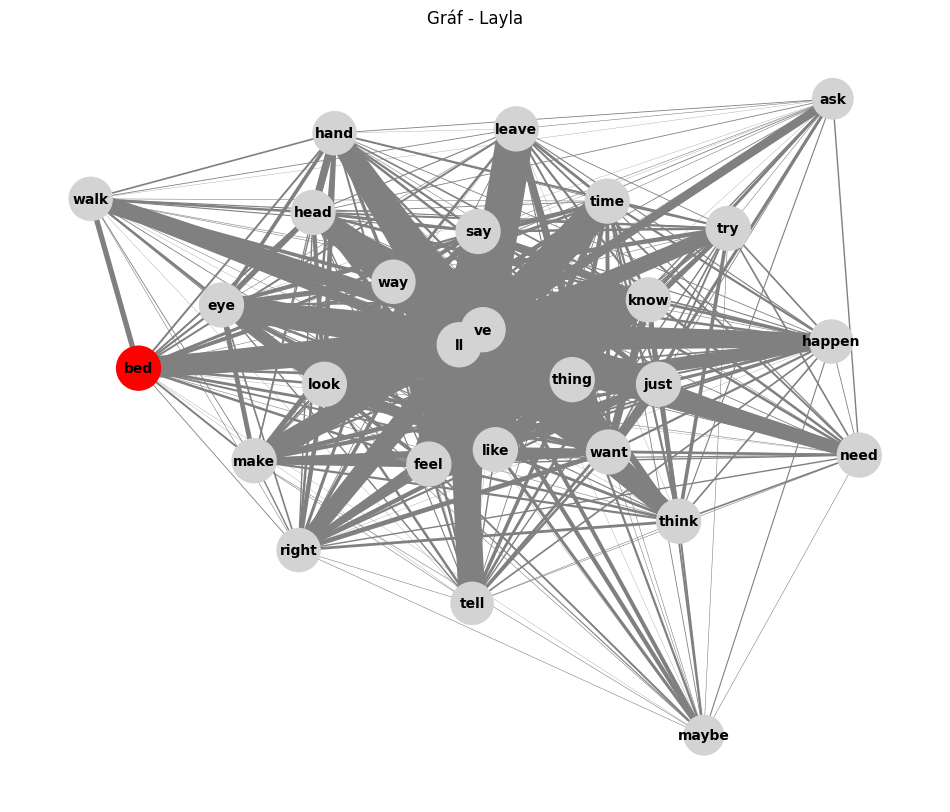


Gráf generálása a következő könyvhöz: Heart Bones
Kulcsszavak (Heart Bones): ['ask' 'away' 'come' 'door' 'eye' 'father' 'feel' 'hand' 'head' 'house'
 'just' 'kiss' 'know' 'like' 'll' 'look' 'make' 'people' 'right' 'samson'
 'sara' 'say' 'stare' 'tell' 'thing' 'think' 'time' 've' 'walk' 'want']


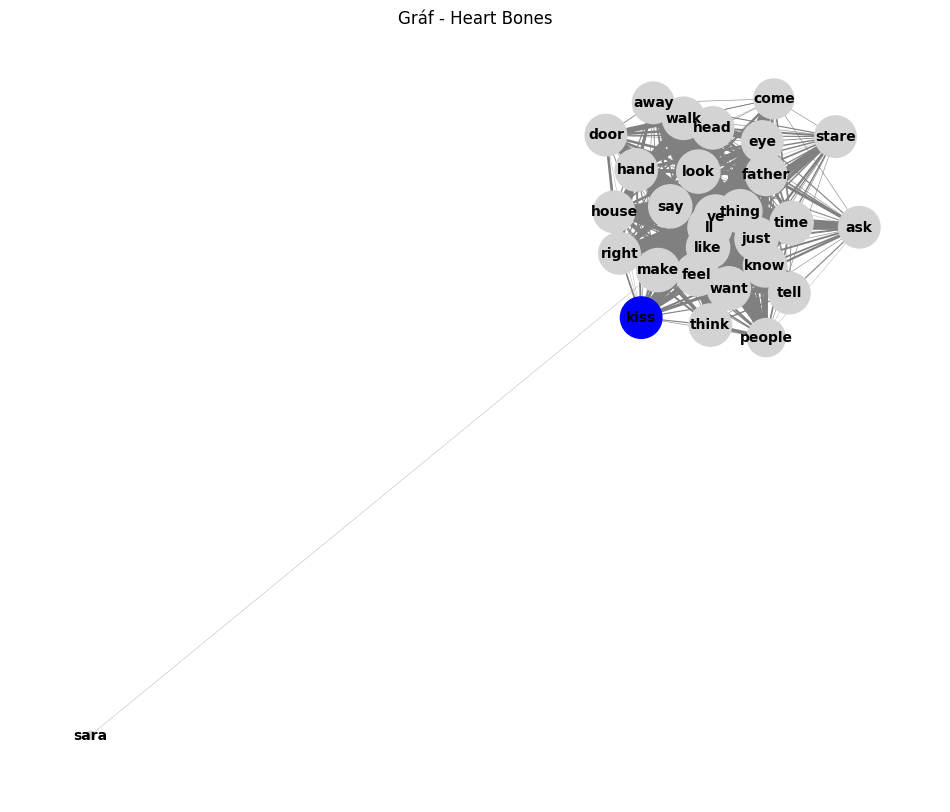


Gráf generálása a következő könyvhöz: November 9
Kulcsszavak (November 9): ['away' 'ben' 'day' 'door' 'eye' 'face' 'fallon' 'feel' 'hand' 'head'
 'just' 'know' 'like' 'll' 'look' 'love' 'make' 'need' 'pull' 'right'
 'say' 'tell' 'thing' 'think' 'time' 've' 'walk' 'want' 'way' 'year']


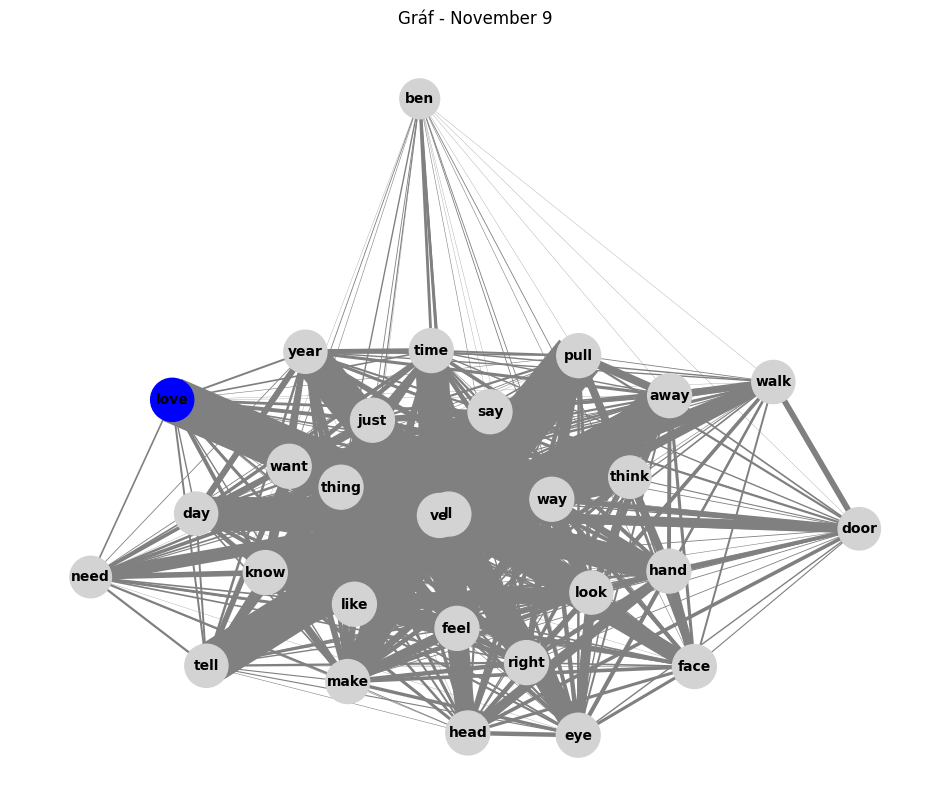


Gráf generálása a következő könyvhöz: Reminders of Him
Kulcsszavak (Reminders of Him): ['ask' 'diem' 'door' 'eye' 'feel' 'good' 'grace' 'hand' 'head' 'just'
 'kenna' 'know' 'ledger' 'like' 'll' 'look' 'make' 'need' 'pull' 'right'
 'say' 'scotty' 'tell' 'think' 'time' 'truck' 've' 'walk' 'want' 'way']


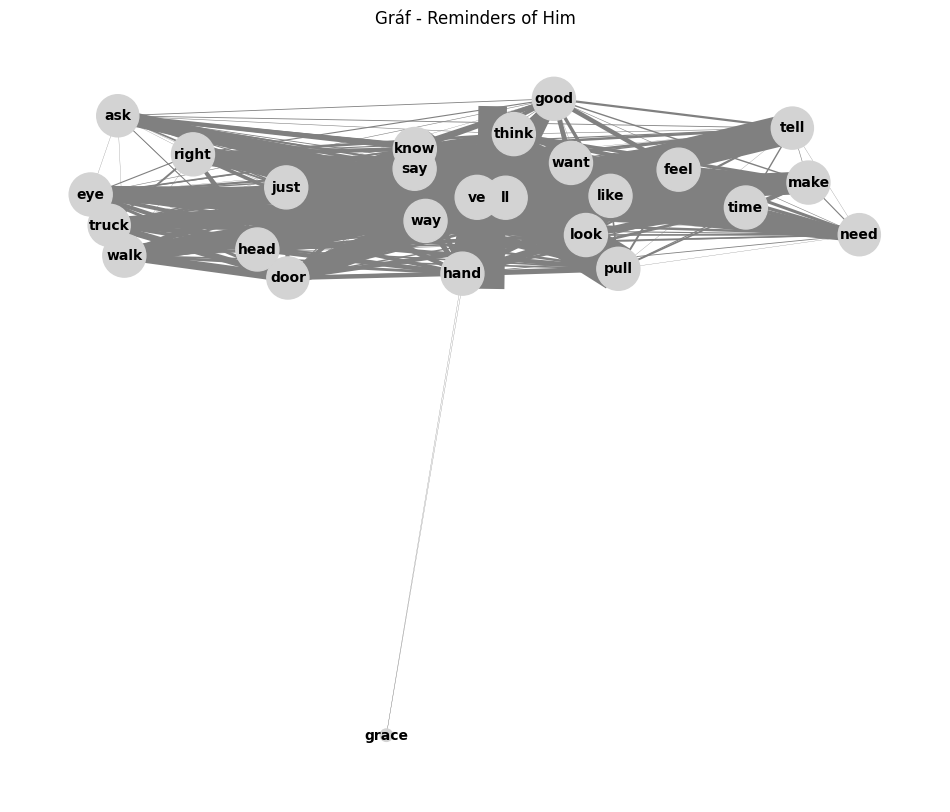


Gráf generálása a következő könyvhöz: It Starts with Us
Kulcsszavak (It Starts with Us): ['ask' 'atlas' 'come' 'door' 'eye' 'feel' 'good' 'hand' 'head' 'josh'
 'just' 'know' 'leave' 'life' 'like' 'lily' 'll' 'look' 'make' 'mother'
 'right' 'ryle' 'say' 'tell' 'thing' 'think' 'time' 've' 'want' 'way']


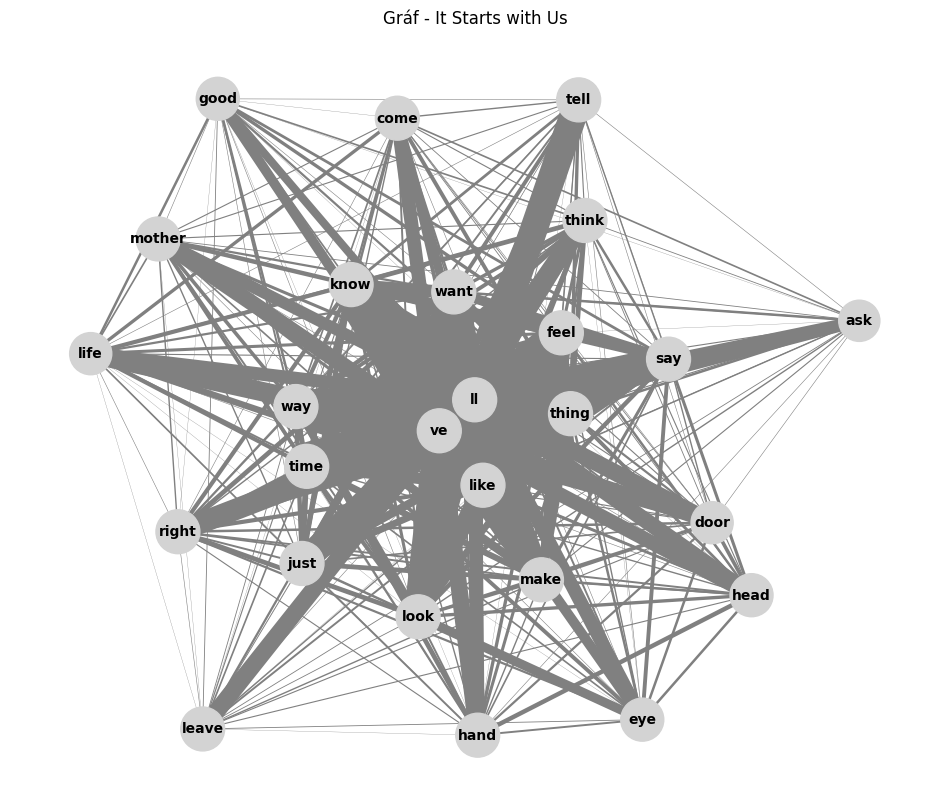


Gráf generálása a következő könyvhöz: Regretting You
Kulcsszavak (Regretting You): ['chris' 'clara' 'door' 'elijah' 'eye' 'feel' 'good' 'hand' 'head' 'jenny'
 'jonah' 'just' 'know' 'like' 'll' 'look' 'make' 'miller' 'mother' 'need'
 'pull' 'right' 'say' 'thing' 'think' 'time' 've' 'walk' 'want' 'way']


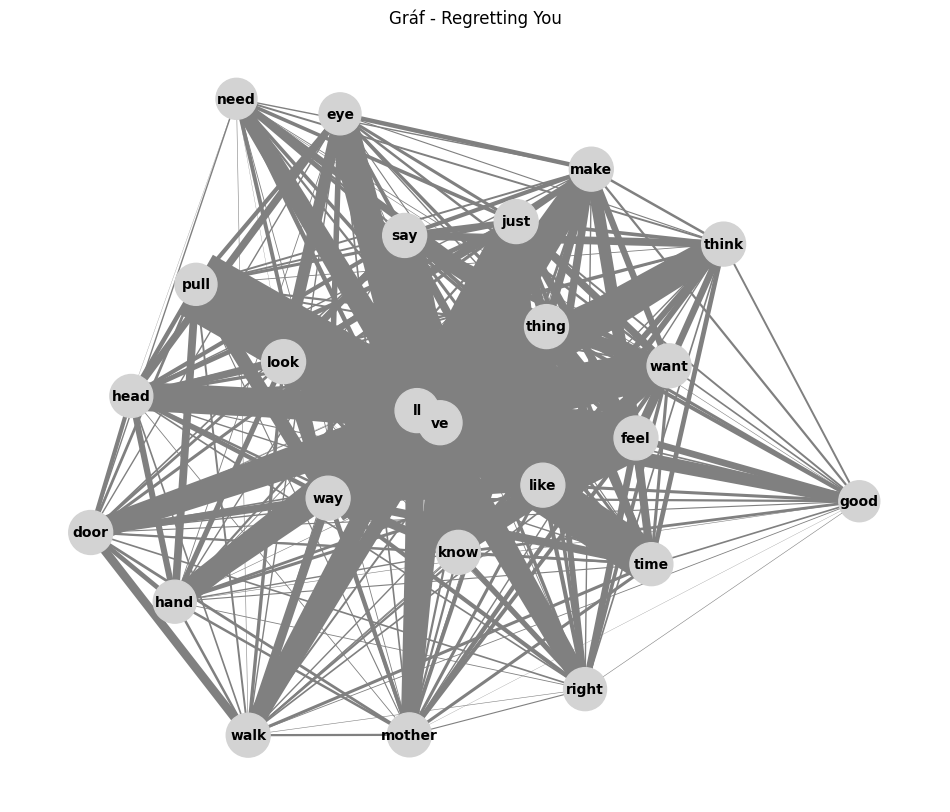


Gráf generálása a következő könyvhöz: Verity
Kulcsszavak (Verity): ['bed' 'come' 'crew' 'door' 'eye' 'feel' 'hand' 'harper' 'head' 'jeremy'
 'just' 'know' 'leave' 'like' 'll' 'look' 'make' 'need' 'open' 'pull'
 'read' 'say' 'tell' 'think' 'time' 'try' 've' 'verity' 'walk' 'want']


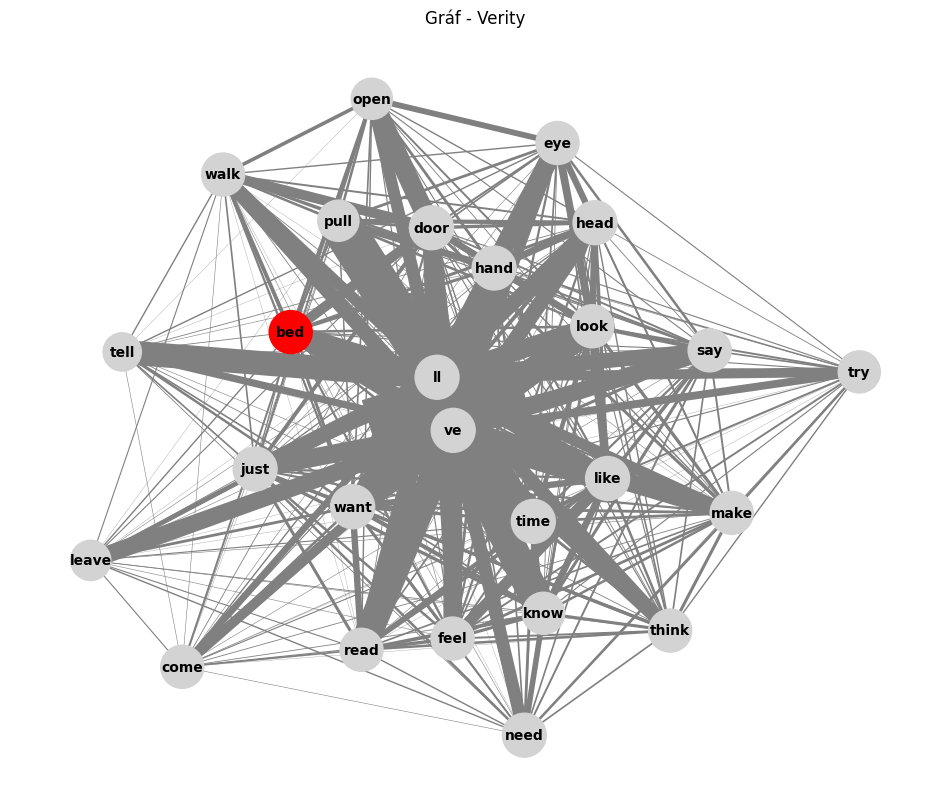


Gráf generálása a következő könyvhöz: Ugly Love
Kulcsszavak (Ugly Love): ['ask' 'corbin' 'door' 'eye' 'face' 'feel' 'good' 'hand' 'head' 'just'
 'kiss' 'know' 'like' 'll' 'look' 'love' 'make' 'miles' 'pull' 'rachel'
 'say' 'smile' 'tate' 'tell' 'think' 'time' 've' 'walk' 'want' 'way']


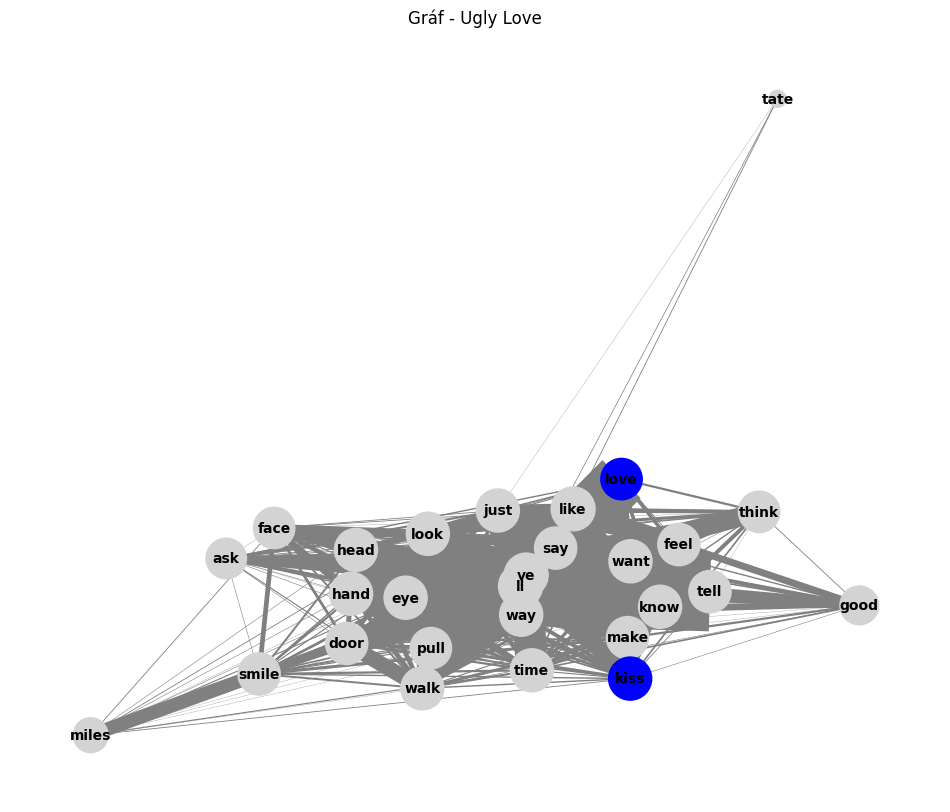


Gráf generálása a következő könyvhöz: Hopeless
Kulcsszavak (Hopeless): ['arm' 'ask' 'away' 'eye' 'face' 'feel' 'hand' 'head' 'holder' 'just'
 'kiss' 'know' 'like' 'll' 'look' 'love' 'make' 'need' 'pull' 'really'
 'right' 'say' 'tell' 'thing' 'think' 'time' 'turn' 've' 'walk' 'want']


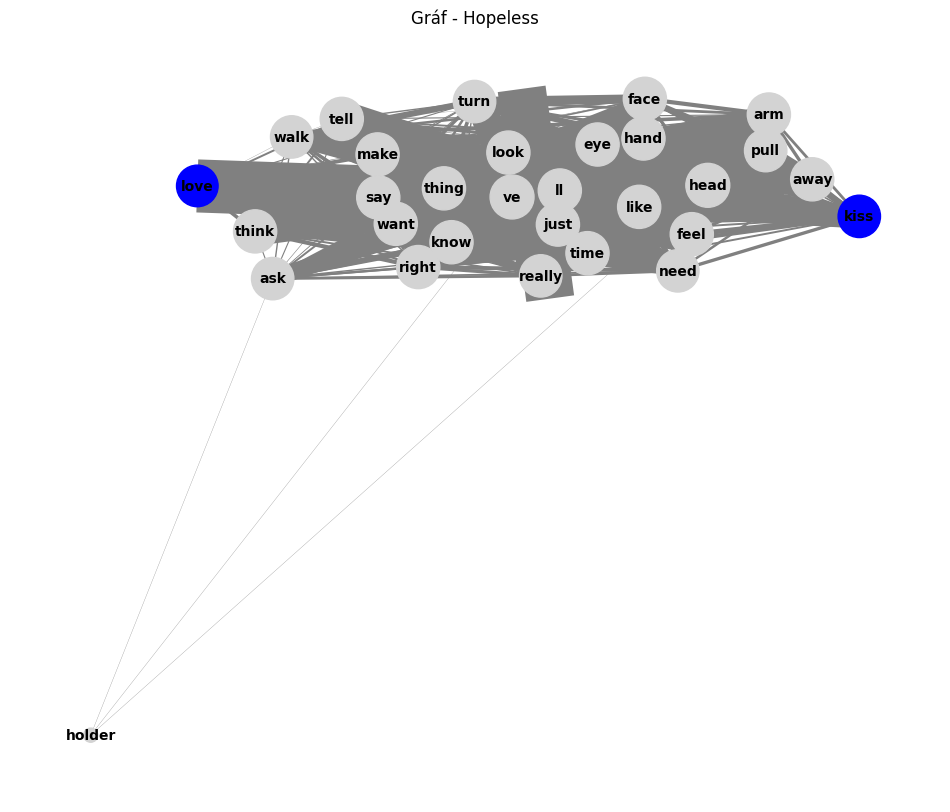


Gráf generálása a következő könyvhöz: It Ends With Us
Kulcsszavak (It Ends With Us): ['allysa' 'atlas' 'come' 'door' 'eye' 'feel' 'good' 'hand' 'head' 'just'
 'know' 'like' 'lily' 'll' 'look' 'make' 'mother' 'pull' 'really' 'right'
 'ryle' 'say' 'tell' 'thing' 'think' 'time' 'try' 've' 'walk' 'want']


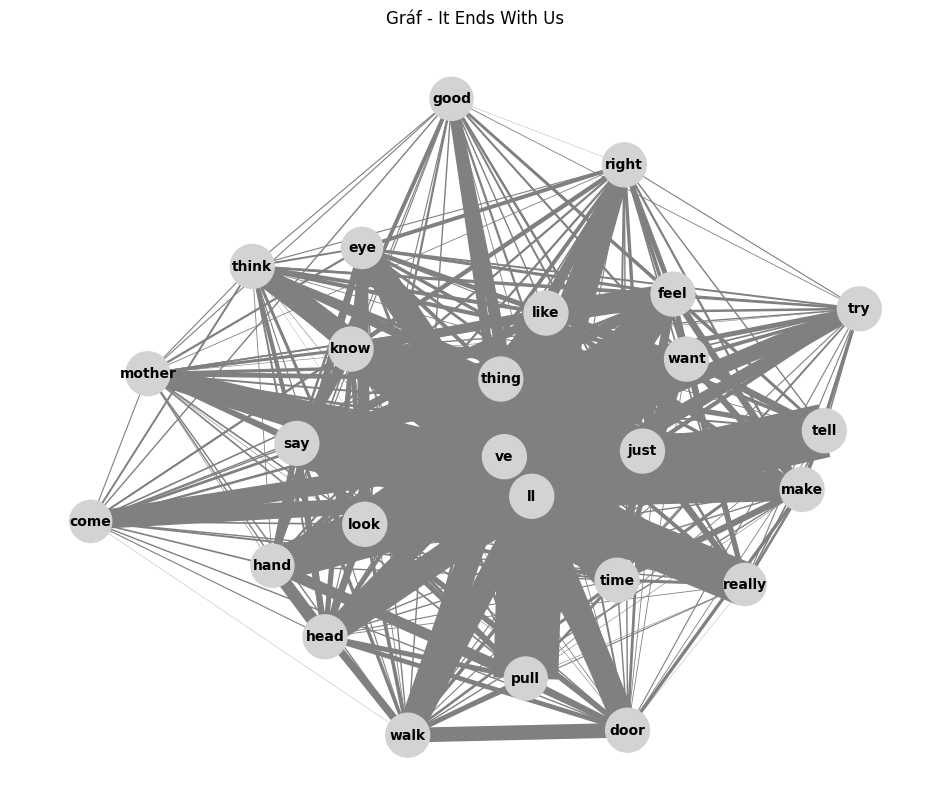

In [45]:
def create_coocc_graph(kw, sents):
    G = nx.Graph()
    for sent in sents:
        present_kw = [w for w in kw if w in sent]
        for i, w1 in enumerate(present_kw):
            for j, w2 in enumerate(present_kw):
                if i != j:  # Elkerüljük az önmagára mutató kapcsolatokat
                    if G.has_edge(w1, w2):
                        G[w1][w2]['weight'] += 1  # Ha már van kapcsolat, növeljük a súlyát
                    else:
                        G.add_edge(w1, w2, weight=1)  # Új kapcsolatot adunk hozzá
    return G

def color_nodes(G, kw_cats):
    node_colors = []
    for node in G.nodes:
        if node in kw_cats['Rom']:
            node_colors.append('blue')
        elif node in kw_cats['Spicy']:
            node_colors.append('red')
        elif node in kw_cats['Abuz']:
            node_colors.append('green')
        else:
            node_colors.append('lightgray')
    return node_colors

def visualize_graph(G, title="Gráf - Központiság elemzés"):
    plt.figure(figsize=(12, 10))
    pos = nx.spring_layout(G, seed=42)
    centrality = nx.degree_centrality(G)
    node_sizes = [v * 1000 for v in centrality.values()]
    node_colors = color_nodes(G, kw_cats)
    edges, weights = zip(*nx.get_edge_attributes(G, 'weight').items())

    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors)
    nx.draw_networkx_edges(G, pos, edgelist=edges, width=[w * 0.1 for w in weights], edge_color='gray')
    nx.draw_networkx_labels(G, pos, font_size=10, font_color='black', font_weight='bold')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Gráf generálása
for doc in proc_doc:
    title = doc['title']
    print(f"\nGráf generálása a következő könyvhöz: {title}")

    sents = doc['sentences']
    vect = TfidfVectorizer(max_features=30, stop_words='english')
    X = vect.fit_transform([' '.join(doc['lemmas'])])
    top_kw = vect.get_feature_names_out()

    print(f"Kulcsszavak ({title}): {top_kw}")

    # Gráf generálása
    G = create_coocc_graph(top_kw, sents)

    # Gráf vizualizálása
    visualize_graph(G, f"Gráf - {title}")
